# Import Libraries

In [ ]:
import sys
import os

# Add src path to import
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..', 'src')))

In [2]:
# Import libraries, variables, and functions
from forecasting.utils.libraries_data_handling import np, pd
from forecasting.utils.libraries_others import time, gc, Enum
from forecasting.utils.libraries_plotting import plt, gridspec, mdates, sns, LinearRegression, sd, pearsonr, spearmanr
from forecasting.constants.columns import col_encode, col_decode, waktu_hari_ordinal, hari_ordinal, musim_ordinal
from forecasting.constants.color import color_variant
from forecasting.utils.memory import cleanup
from forecasting.constants.enums import ColumnGroup, PeriodList
from forecasting.utils.ordinal_encode import encode_ordinal
from forecasting.utils.visualization import descriptive_statistics_plot, extract_statistical_values, univariate_analysis, seasonal_decomp_plot, seasonal_decomp, bivariate_analysis, correlation_heatmap


# Load Dataset

In [3]:
# Load xlsx dataset
df_past = pd.read_excel('../data/raw/past_covariates.xlsx')
df_past.head()

,timestamp,pm2_5 (μg/m³),pm10 (μg/m³),carbon_monoxide (μg/m³),nitrogen_dioxide (μg/m³),sulphur_dioxide (μg/m³),ozone (μg/m³),temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),rain (mm),surface_pressure (hPa),wind_speed_10m (km/h),wind_direction_10m (°),direct_radiation (W/m²)
0,2022-08-05 00:00:00,20.5,31.0,383,30.1,17.0,30,25.6,82,22.3,0.0,1010.5,6.4,286,0
1,2022-08-05 01:00:00,22.4,33.4,333,26.9,17.0,30,25.1,79,21.3,0.0,1010.2,9.0,275,0
2,2022-08-05 02:00:00,24.9,36.9,327,26.6,17.1,27,24.3,81,20.8,0.0,1010.2,7.6,262,0
3,2022-08-05 03:00:00,26.8,39.6,340,27.6,17.5,23,23.9,82,20.6,0.0,1010.3,6.3,239,0
4,2022-08-05 04:00:00,27.3,40.0,384,29.0,19.0,19,23.4,85,20.7,0.0,1010.7,4.1,218,0


In [4]:
# Load future dataset
df_future = pd.read_excel('../data/raw/future_covariates.xlsx')
df_future.head()

,timestamp,pembagian_waktu/hari,hari_per_minggu,hari_libur_nasional,musim
0,2022-08-05 00:00:00,Malam,1900-01-06,False,Musim kemarau
1,2022-08-05 01:00:00,Malam,1900-01-06,False,Musim kemarau
2,2022-08-05 02:00:00,Malam,1900-01-06,False,Musim kemarau
3,2022-08-05 03:00:00,Malam,1900-01-06,False,Musim kemarau
4,2022-08-05 04:00:00,Malam,1900-01-06,False,Musim kemarau


# Data Preprocessing

## Exploratory Data Analysis

In [5]:
# Setting sns plot theme
sns.set_theme(style='white', font_scale=0.9)

# Setting number after coma to max 5 digits
np.set_printoptions(suppress=True, precision=5)

# Make folder for EDA results
os.makedirs('../reports/figures/univariate_analysis', exist_ok=True)
os.makedirs('../reports/figures/univariate_analysis/seasonal_decompose', exist_ok=True)
os.makedirs('../reports/figures/bivariate_analysis', exist_ok=True)

### Data Cleaning

#### Past Dataset

In [6]:
# Check data type
df_past.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25464 entries, 0 to 25463
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   timestamp                 25464 non-null  datetime64[ns]
 1   pm2_5 (μg/m³)             25464 non-null  float64       
 2   pm10 (μg/m³)              25464 non-null  float64       
 3   carbon_monoxide (μg/m³)   25464 non-null  int64         
 4   nitrogen_dioxide (μg/m³)  25464 non-null  float64       
 5   sulphur_dioxide (μg/m³)   25464 non-null  float64       
 6   ozone (μg/m³)             25464 non-null  int64         
 7   temperature_2m (°C)       25464 non-null  float64       
 8   relative_humidity_2m (%)  25464 non-null  int64         
 9   dew_point_2m (°C)         25464 non-null  float64       
 10  rain (mm)                 25464 non-null  float64       
 11  surface_pressure (hPa)    25464 non-null  float64       
 12  wind_speed_10m (km

In [7]:
# Change data type

# Fixing timestamp format
df_past['timestamp']                = df_past['timestamp'].dt.floor('h')

# Change int to float
df_past['carbon_monoxide (μg/m³)']  = df_past['carbon_monoxide (μg/m³)'].astype(float)
df_past['ozone (μg/m³)']            = df_past['ozone (μg/m³)'].astype(float)
df_past['relative_humidity_2m (%)'] = df_past['relative_humidity_2m (%)'].astype(float)
df_past['wind_direction_10m (°)']   = df_past['wind_direction_10m (°)'].astype(float)
df_past['direct_radiation (W/m²)']  = df_past['direct_radiation (W/m²)'].astype(float)

# Check data
df_past.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25464 entries, 0 to 25463
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   timestamp                 25464 non-null  datetime64[ns]
 1   pm2_5 (μg/m³)             25464 non-null  float64       
 2   pm10 (μg/m³)              25464 non-null  float64       
 3   carbon_monoxide (μg/m³)   25464 non-null  float64       
 4   nitrogen_dioxide (μg/m³)  25464 non-null  float64       
 5   sulphur_dioxide (μg/m³)   25464 non-null  float64       
 6   ozone (μg/m³)             25464 non-null  float64       
 7   temperature_2m (°C)       25464 non-null  float64       
 8   relative_humidity_2m (%)  25464 non-null  float64       
 9   dew_point_2m (°C)         25464 non-null  float64       
 10  rain (mm)                 25464 non-null  float64       
 11  surface_pressure (hPa)    25464 non-null  float64       
 12  wind_speed_10m (km

In [8]:
# Change colomns name
df_past_encoded = df_past.rename(columns=col_encode).copy()

# Set index
df_past.set_index('timestamp', inplace=True)
df_past_encoded.set_index('t', inplace=True)

# Set index type to datetime
df_past.index = pd.to_datetime(df_past.index)
df_past_encoded.index = pd.to_datetime(df_past_encoded.index)

# Check data shape
print('Data shape:',df_past_encoded.shape,'\n\n')

df_past_encoded.head()

Data shape: (25464, 14) 




,y1,y2,y3,y4,y5,y6,x1,x2,x3,x4,x5,x6,x7,x8
t,,,,,,,,,,,,,,
2022-08-05 00:00:00,20.5,31.0,383.0,30.1,17.0,30.0,25.6,82.0,22.3,0.0,1010.5,6.4,286.0,0.0
2022-08-05 01:00:00,22.4,33.4,333.0,26.9,17.0,30.0,25.1,79.0,21.3,0.0,1010.2,9.0,275.0,0.0
2022-08-05 02:00:00,24.9,36.9,327.0,26.6,17.1,27.0,24.3,81.0,20.8,0.0,1010.2,7.6,262.0,0.0
2022-08-05 03:00:00,26.8,39.6,340.0,27.6,17.5,23.0,23.9,82.0,20.6,0.0,1010.3,6.3,239.0,0.0
2022-08-05 04:00:00,27.3,40.0,384.0,29.0,19.0,19.0,23.4,85.0,20.7,0.0,1010.7,4.1,218.0,0.0


#### Future Dataset

In [9]:
# Check data type
df_future.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35707 entries, 0 to 35706
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   timestamp             35707 non-null  datetime64[ns]
 1   pembagian_waktu/hari  35707 non-null  object        
 2   hari_per_minggu       35707 non-null  datetime64[ns]
 3   hari_libur_nasional   35707 non-null  bool          
 4   musim                 35707 non-null  object        
dtypes: bool(1), datetime64[ns](2), object(2)
memory usage: 1.1+ MB


In [10]:
# Change data type

# Fixing timestamp format
df_future['timestamp']            = df_future['timestamp'].dt.floor('h')

# Change object to string
df_future['pembagian_waktu/hari'] = df_future['pembagian_waktu/hari'].astype('string')
df_future['hari_per_minggu']      = df_future['timestamp'].dt.day_name().astype('string')
df_future['musim']                = df_future['musim'].astype('string')

# Change categorical to numerical (ordinal ranking)
df_future['pembagian_waktu/hari'] = encode_ordinal(df_future, 'pembagian_waktu/hari', waktu_hari_ordinal)
df_future['hari_per_minggu']      = encode_ordinal(df_future, 'hari_per_minggu', hari_ordinal)
df_future['hari_libur_nasional']  = encode_ordinal(df_future, 'hari_libur_nasional', musim_ordinal)
df_future['musim']                = encode_ordinal(df_future, 'musim', musim_ordinal)

# Check data
df_future.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35707 entries, 0 to 35706
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   timestamp             35707 non-null  datetime64[ns]
 1   pembagian_waktu/hari  35707 non-null  float64       
 2   hari_per_minggu       35707 non-null  float64       
 3   hari_libur_nasional   35707 non-null  float64       
 4   musim                 35707 non-null  float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 1.4 MB


In [11]:
# Change colomns name
df_future_encoded = df_future.rename(columns=col_encode).copy()

# Set index
df_future.set_index('timestamp', inplace=True)
df_future_encoded.set_index('t', inplace=True)

# Set index type to datetime
df_future.index = pd.to_datetime(df_future.index)
df_future_encoded.index = pd.to_datetime(df_future_encoded.index)

# Check data shape
print('Data shape:',df_future_encoded.shape,'\n\n')

df_future_encoded.head()

Data shape: (35707, 4) 




,x9,x10,x11,x12
t,,,,
2022-08-05 00:00:00,3.0,5.0,0.0,1.0
2022-08-05 01:00:00,3.0,5.0,0.0,1.0
2022-08-05 02:00:00,3.0,5.0,0.0,1.0
2022-08-05 03:00:00,3.0,5.0,0.0,1.0
2022-08-05 04:00:00,3.0,5.0,0.0,1.0


### Statistic Descriptive

In [12]:
# Check descriptive statistics dataset
pd.set_option('display.float_format', '{:.3f}'.format)
statdas = df_past.describe()
statdas.T

,count,mean,std,min,25%,50%,75%,max
pm2_5 (μg/m³),25464.000,37.089,23.131,0.500,20.400,30.600,46.800,195.600
pm10 (μg/m³),25464.000,49.540,28.895,0.800,28.600,41.600,62.900,212.300
carbon_monoxide (μg/m³),25464.000,1010.616,870.051,0.000,481.000,738.000,1200.000,9391.000
nitrogen_dioxide (μg/m³),25464.000,38.159,30.539,0.000,16.700,28.300,51.100,284.800
sulphur_dioxide (μg/m³),25464.000,28.182,17.439,0.200,15.900,23.800,36.100,150.900
ozone (μg/m³),25464.000,68.488,57.695,-1.000,23.000,53.000,105.000,337.000
temperature_2m (°C),25464.000,27.843,2.852,21.100,25.600,27.200,29.700,38.100
relative_humidity_2m (%),25464.000,76.477,16.225,16.000,68.000,80.000,90.000,100.000
dew_point_2m (°C),25464.000,22.846,2.150,4.000,22.200,23.500,24.200,26.700
rain (mm),25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


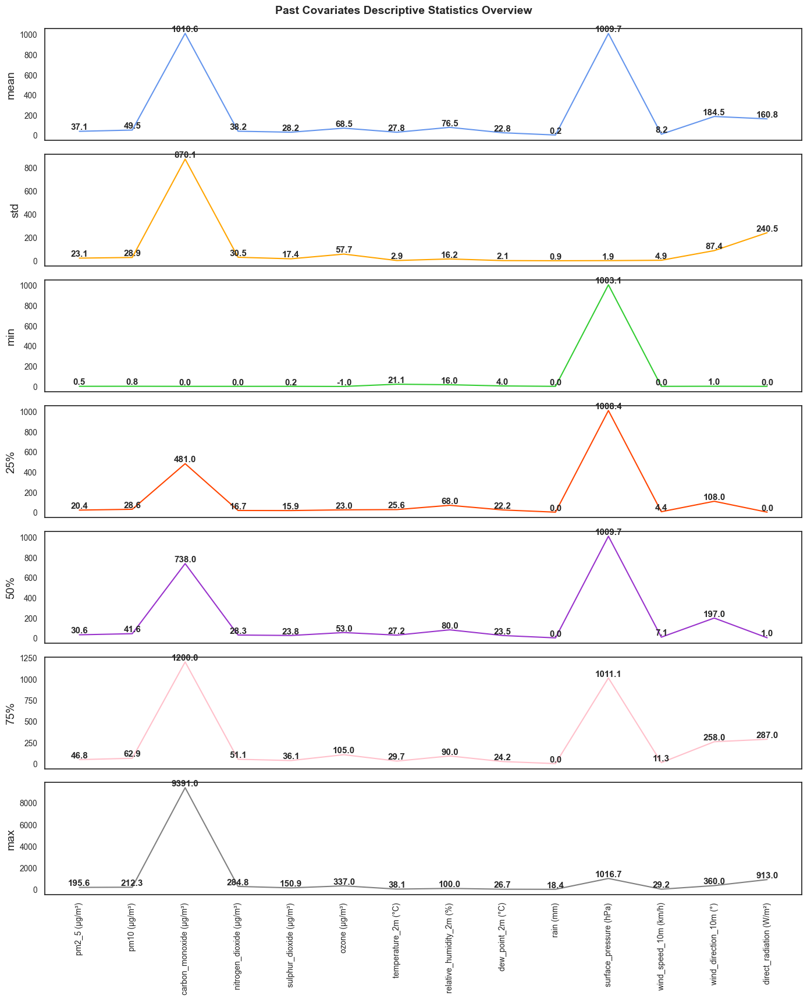

In [13]:
# Statistic descriptive plot
descriptive_statistics_plot(
    df          = statdas[1:].T, 
    color_var   = color_variant,
    show_values = True
)

### Univariate Analysis

#### Line Plot

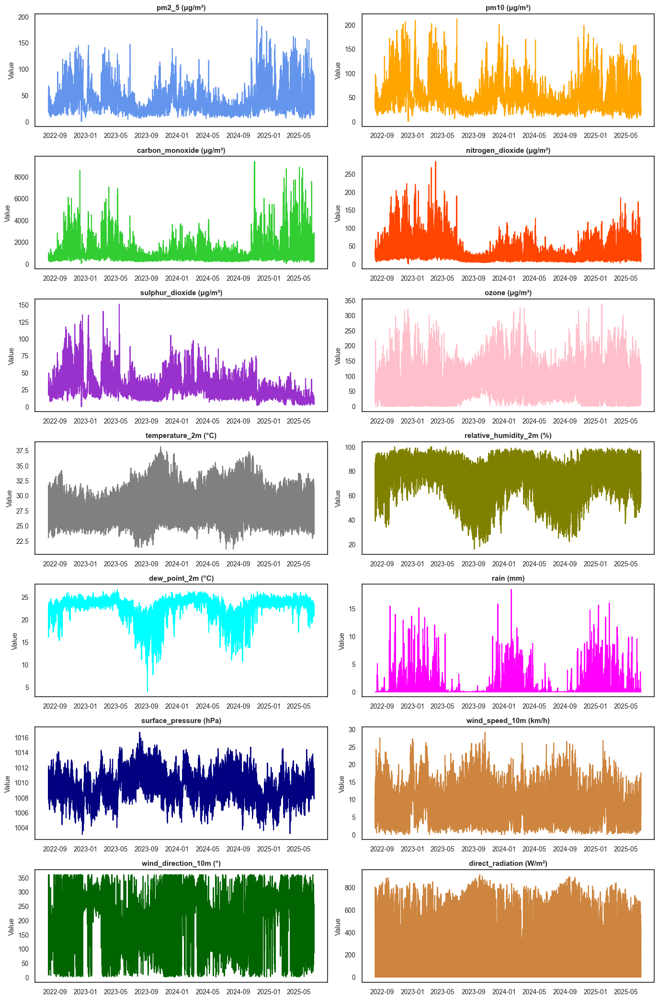

In [14]:
# Data distribution with lineplot
univariate_analysis(
    df            = df_past_encoded, 
    plot_type     = 'lineplot', 
    col_decode    = col_decode, 
    nrows         = int(ColumnGroup.NUMERICAL / 2), 
    ncols         = 2, 
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    color_variant = color_variant,
    group         = ColumnGroup.NUMERICAL,
)

#### Scatter Plot

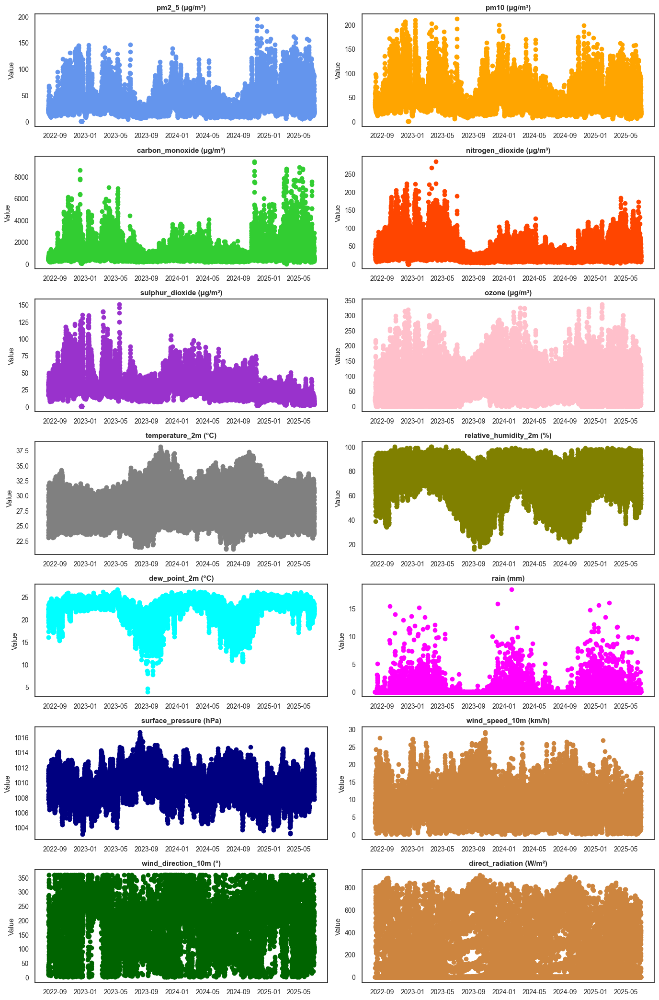

In [15]:
# Data distribution with scatterplot
univariate_analysis(
    df            = df_past_encoded,
    plot_type     = 'scatterplot',
    col_decode    = col_decode,
    nrows         = int(ColumnGroup.NUMERICAL / 2),
    ncols         = 2,
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    color_variant = color_variant,
    group         = ColumnGroup.NUMERICAL
)

#### Histogram Plot

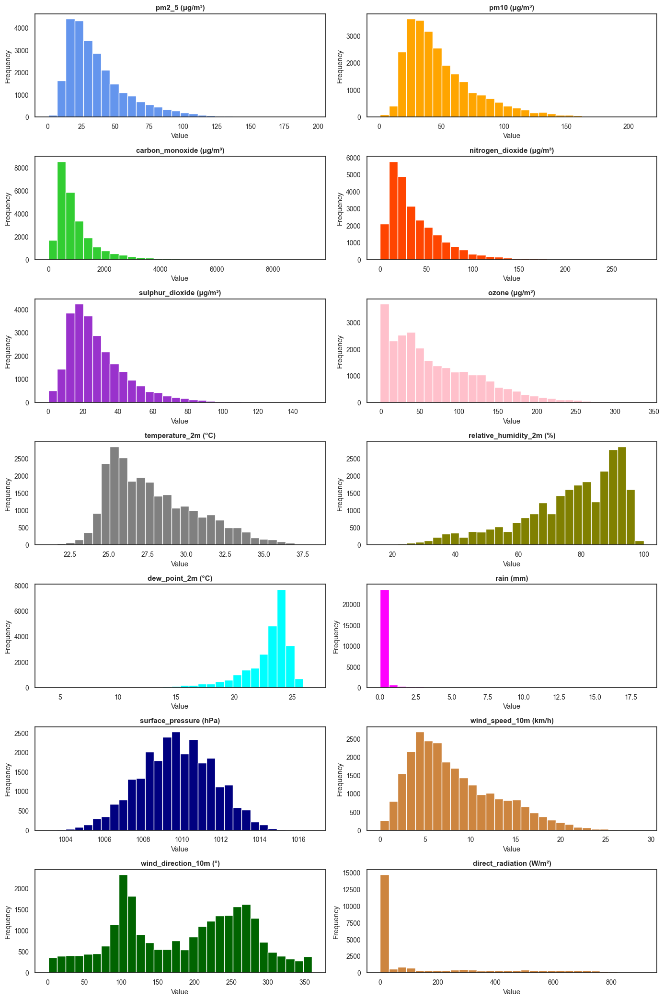

In [16]:
# Data distribution with histplot
univariate_analysis(
    df            = df_past_encoded, 
    plot_type     = 'histplot', 
    col_decode    = col_decode, 
    nrows         = int(ColumnGroup.NUMERICAL / 2), 
    ncols         = 2, 
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    color_variant = color_variant,
    group         = ColumnGroup.NUMERICAL,
)

#### Box Plot

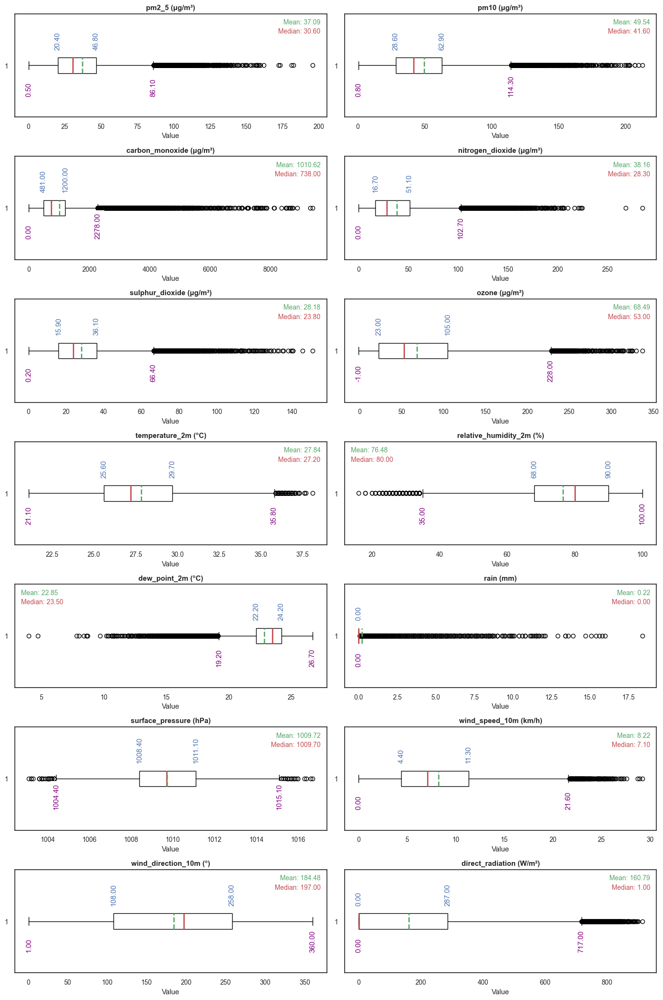

In [17]:
# Numerical data distribution with boxplot
univariate_analysis(
    df            = df_past_encoded, 
    plot_type     = 'boxplot', 
    col_decode    = col_decode, 
    nrows         = int(ColumnGroup.NUMERICAL / 2), 
    ncols         = 2, 
    figsize       = (14, int(ColumnGroup.NUMERICAL * 1.5)),
    group         = ColumnGroup.NUMERICAL,
    statdas       = statdas.rename(columns=col_encode),
    showmeans     = True,
    meanline      = True,
    medianprops   = {'color': 'r', 'linewidth': 2},
    meanprops     = {'color': 'g', 'linewidth': 2, 'linestyle': '--'}
)

#### Seasonal Decompose

In [18]:
# Take only target variables
Y = df_past_encoded[df_past_encoded.columns[:ColumnGroup.TARGET]]
Y.head()

,y1,y2,y3,y4,y5,y6
t,,,,,,
2022-08-05 00:00:00,20.500,31.000,383.000,30.100,17.000,30.000
2022-08-05 01:00:00,22.400,33.400,333.000,26.900,17.000,30.000
2022-08-05 02:00:00,24.900,36.900,327.000,26.600,17.100,27.000
2022-08-05 03:00:00,26.800,39.600,340.000,27.600,17.500,23.000
2022-08-05 04:00:00,27.300,40.000,384.000,29.000,19.000,19.000


##### Yearly

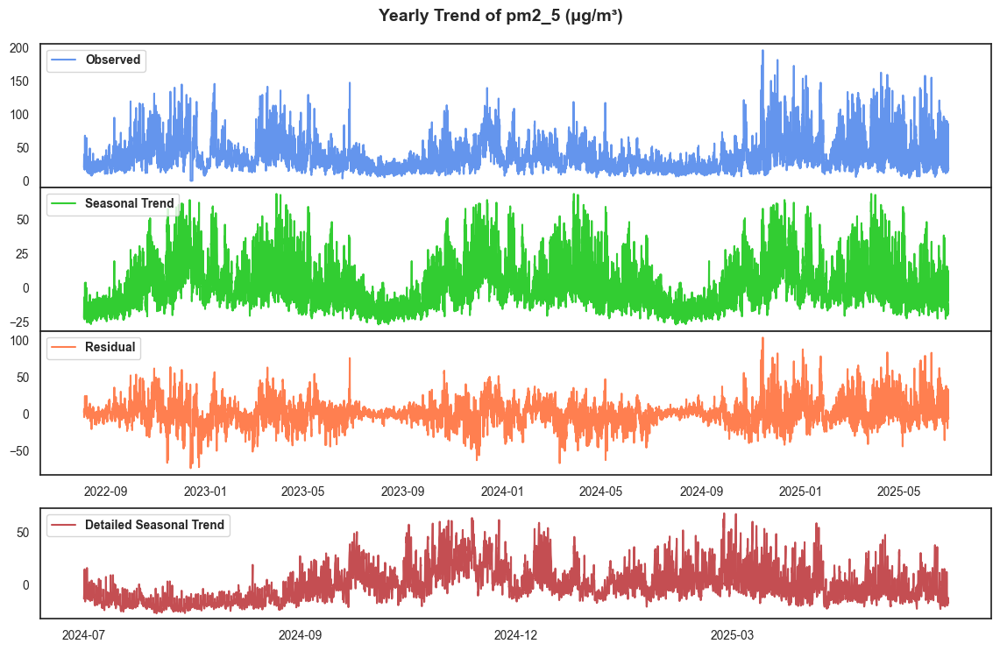

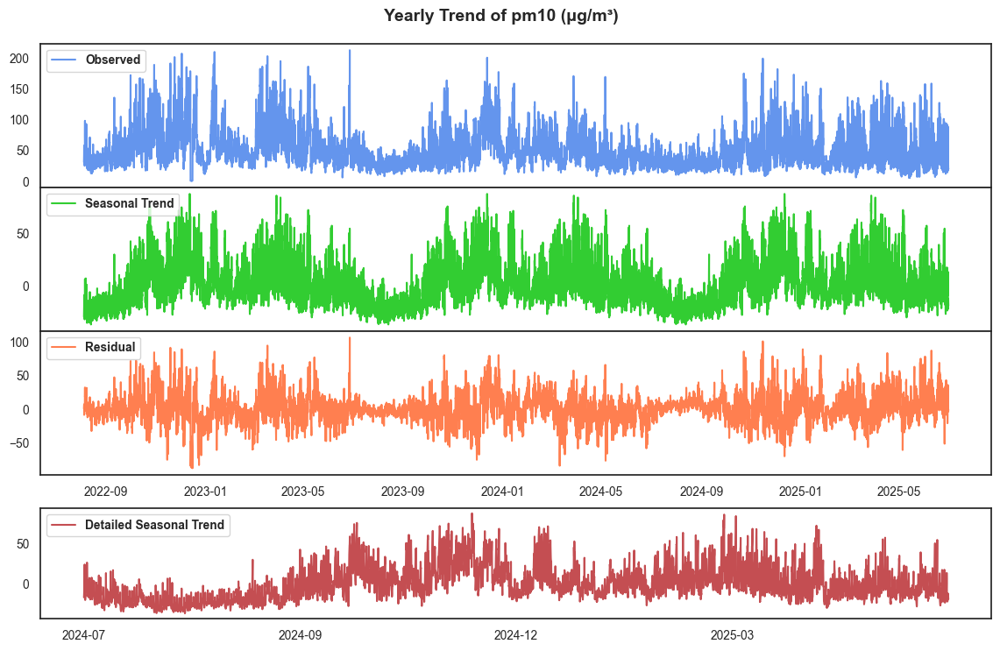

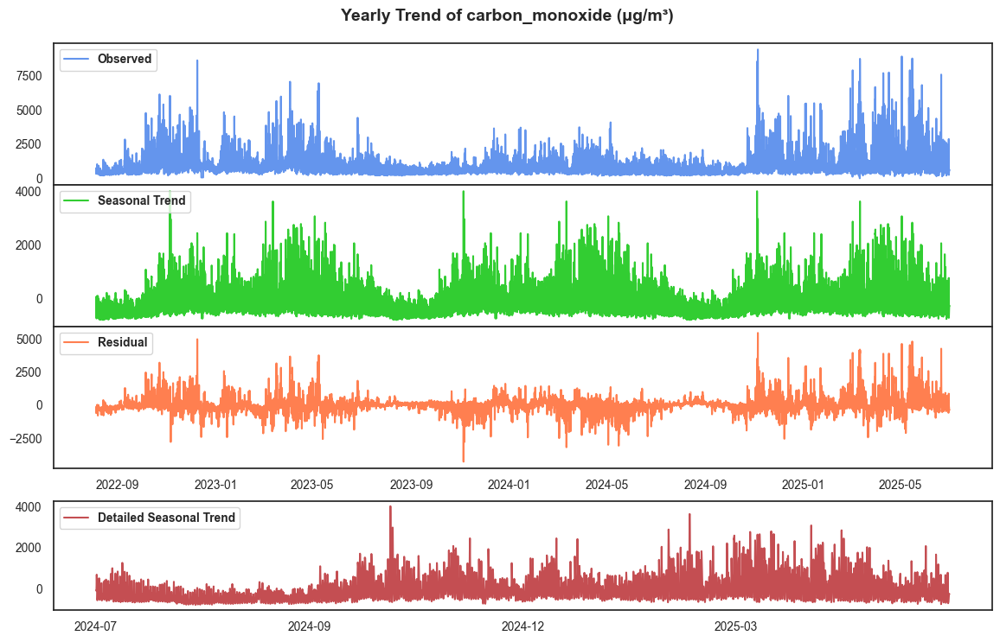

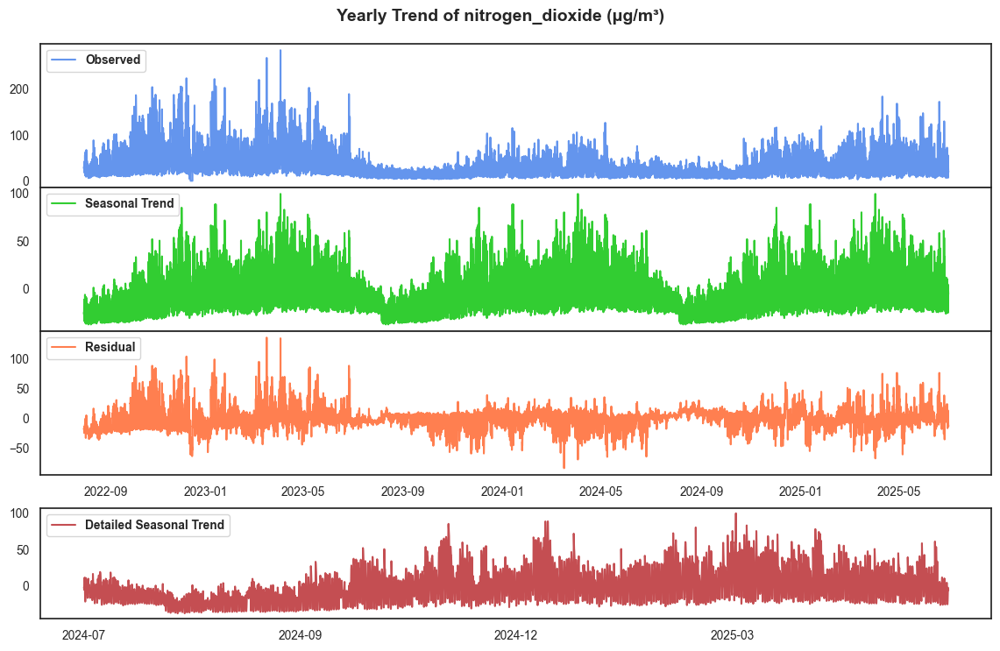

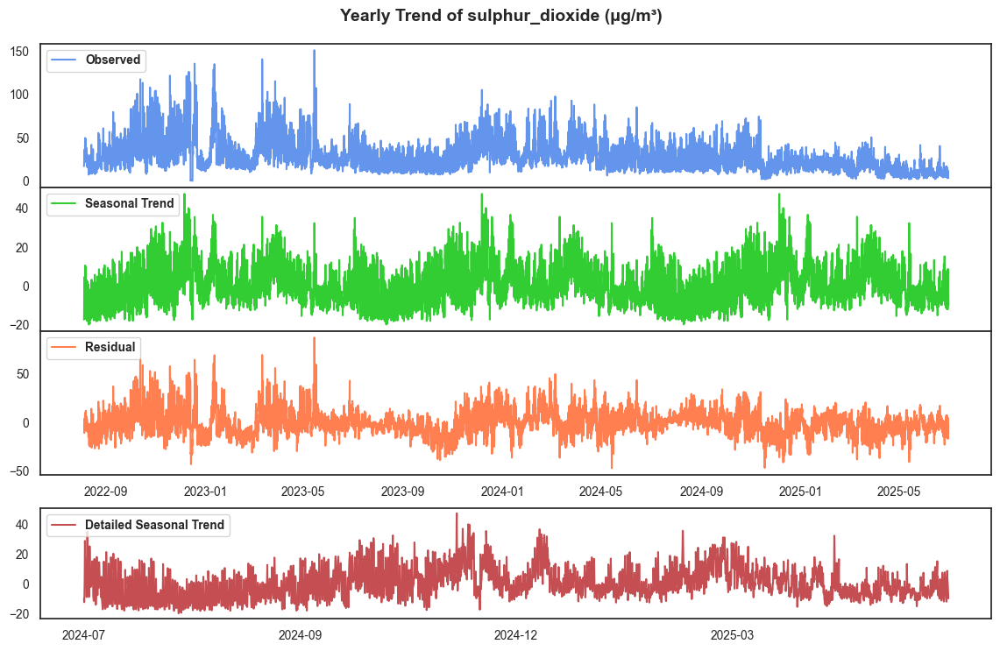

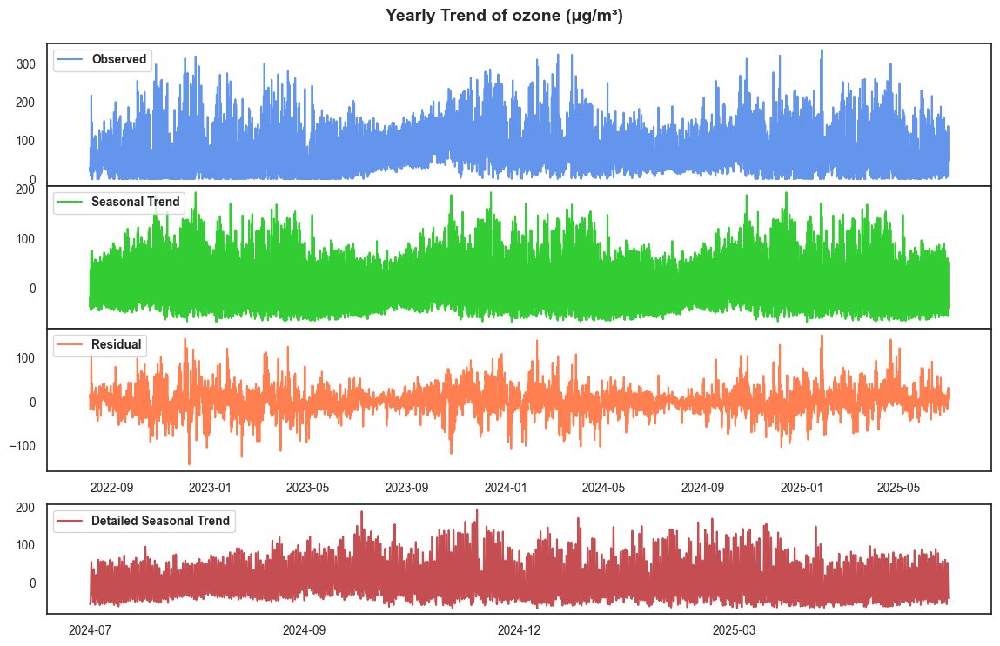

In [19]:
# 1 year seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.Y1
)

##### 6 months

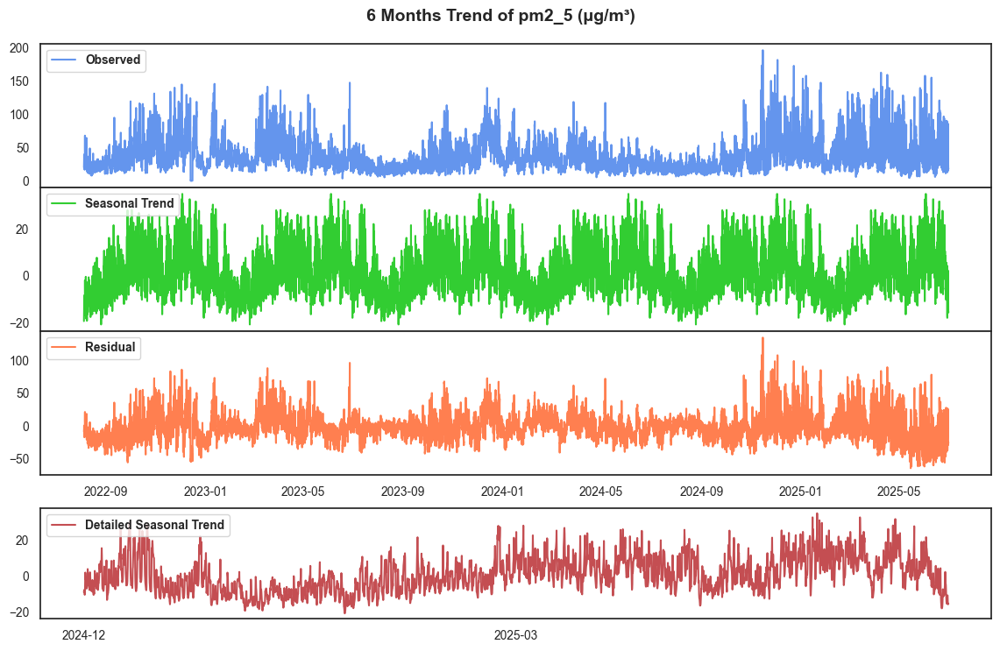

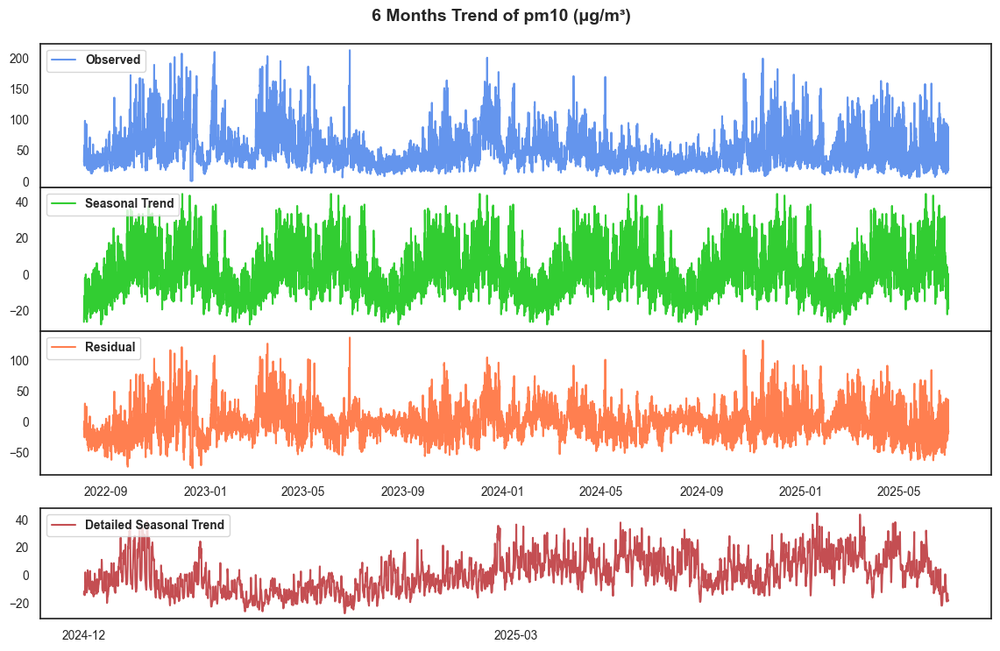

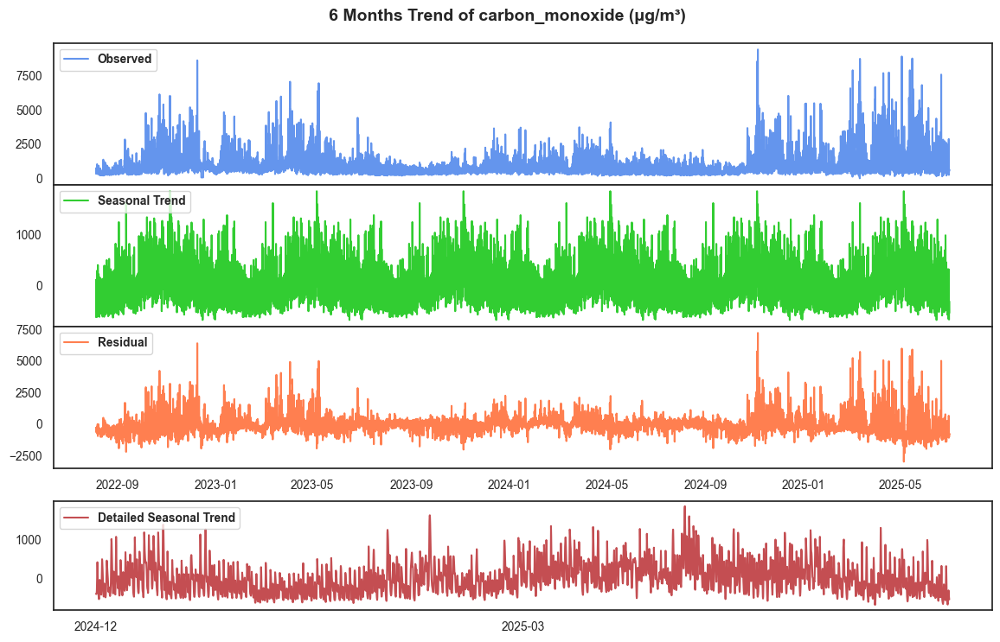

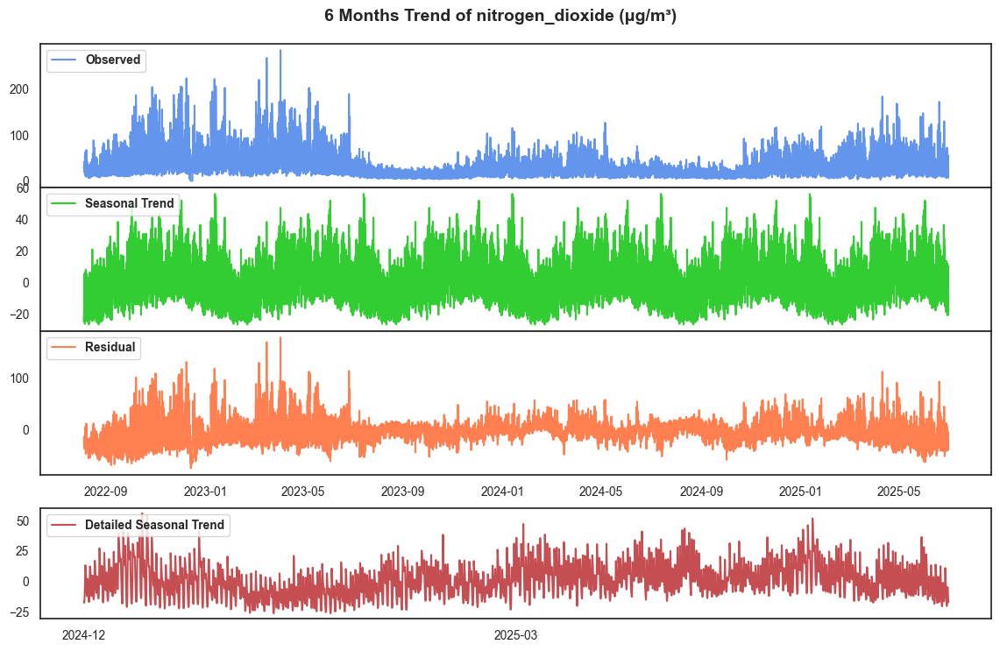

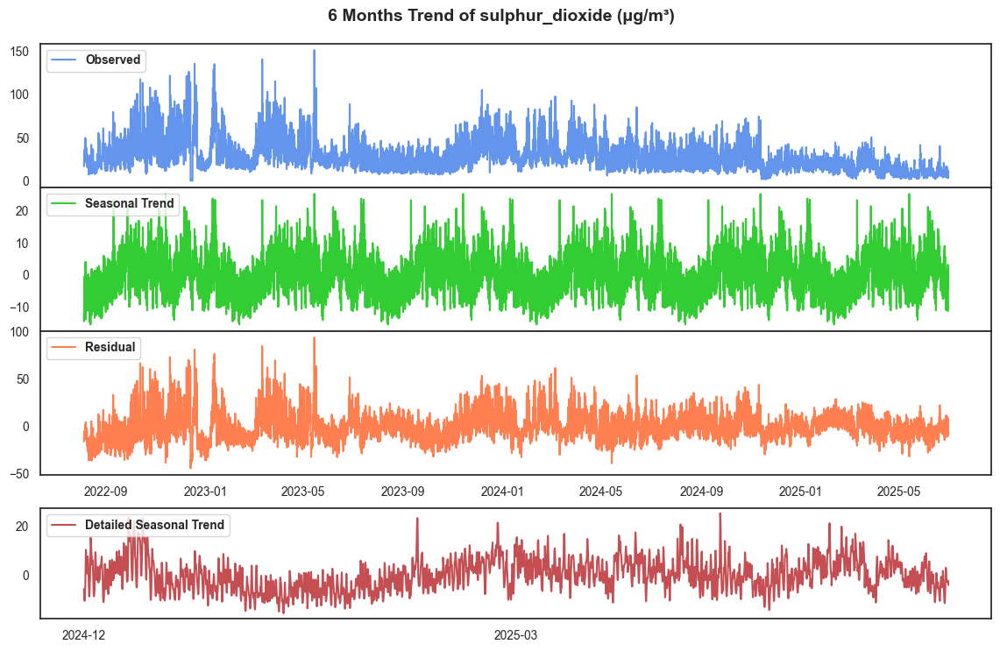

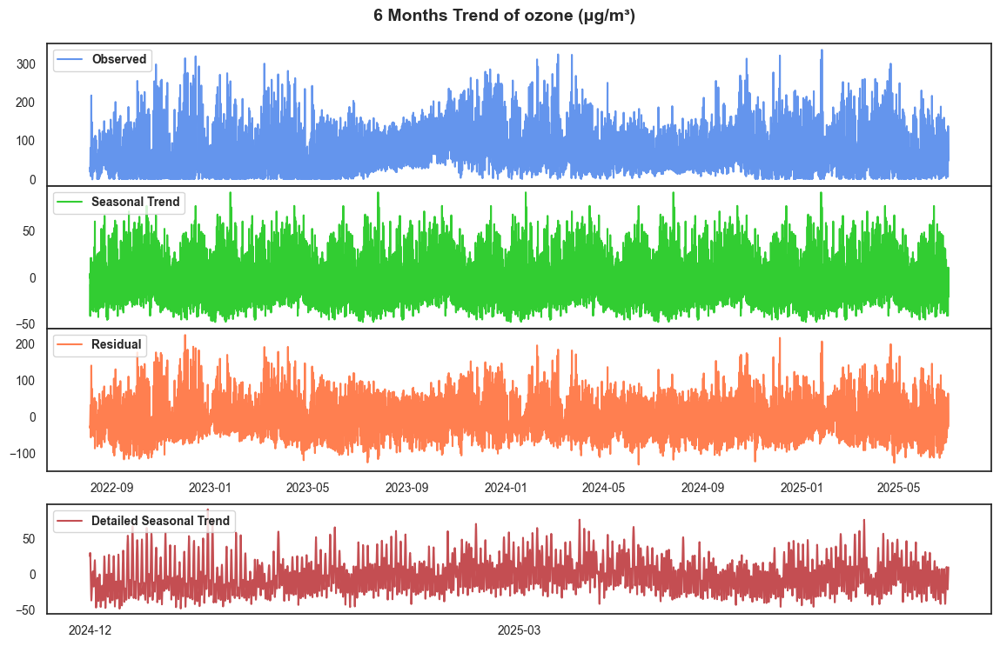

In [20]:
# 6 months seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.M6
)

##### 3 months

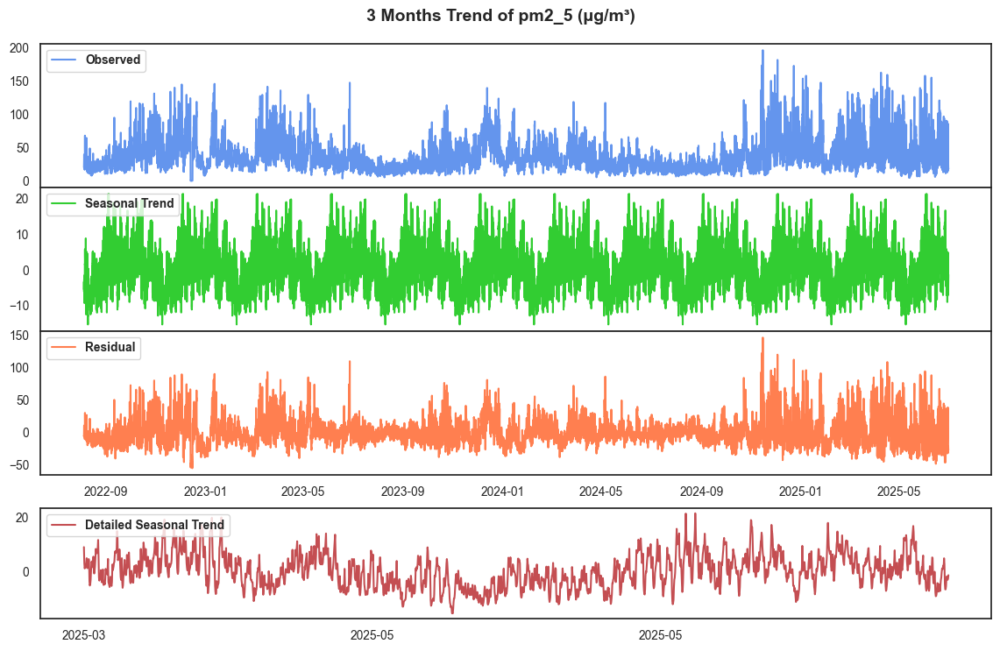

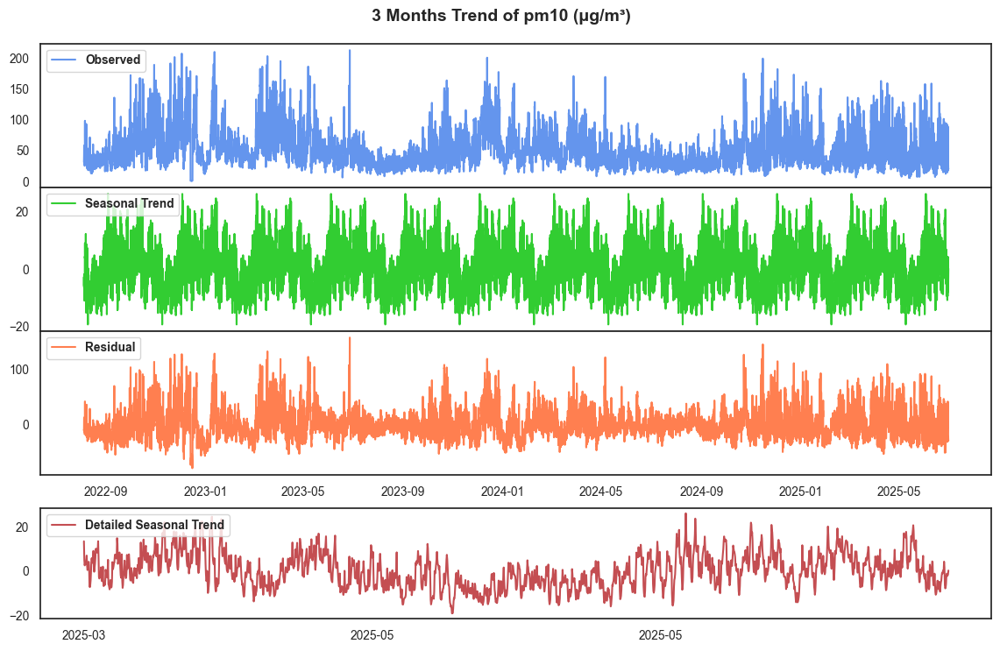

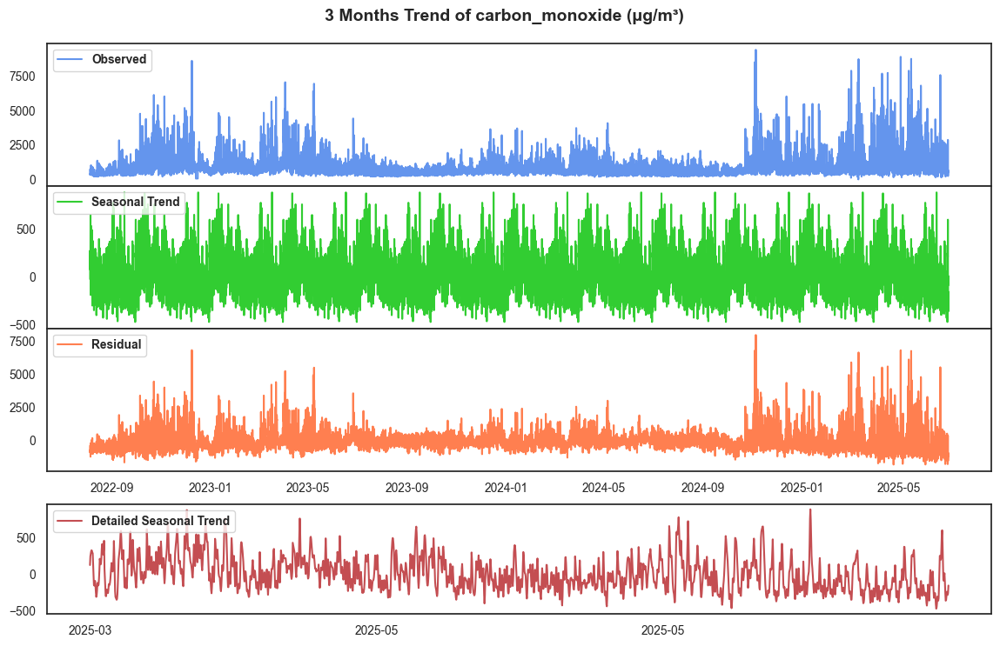

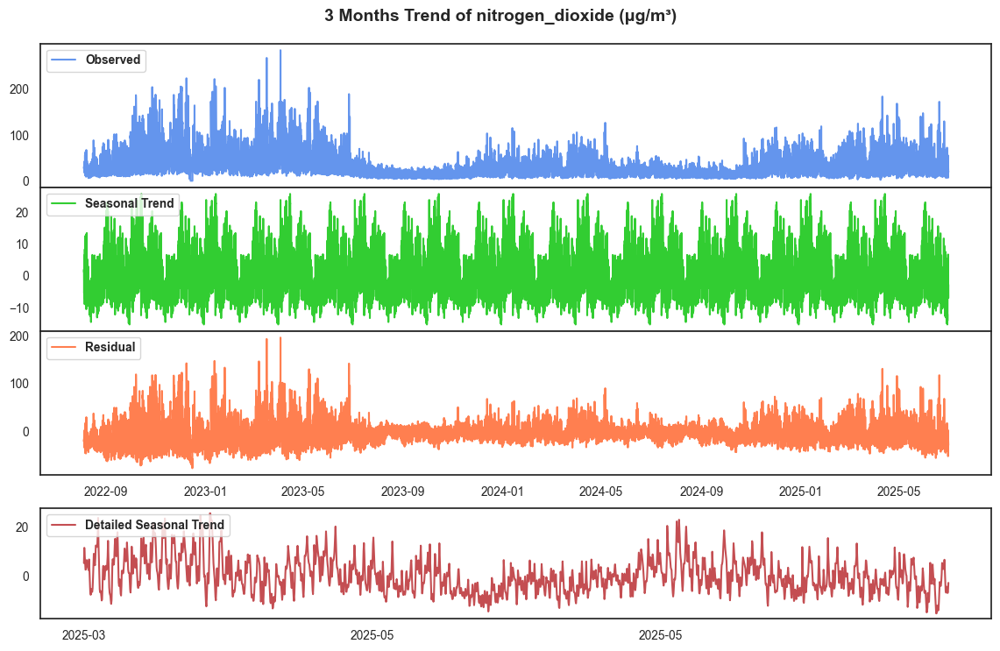

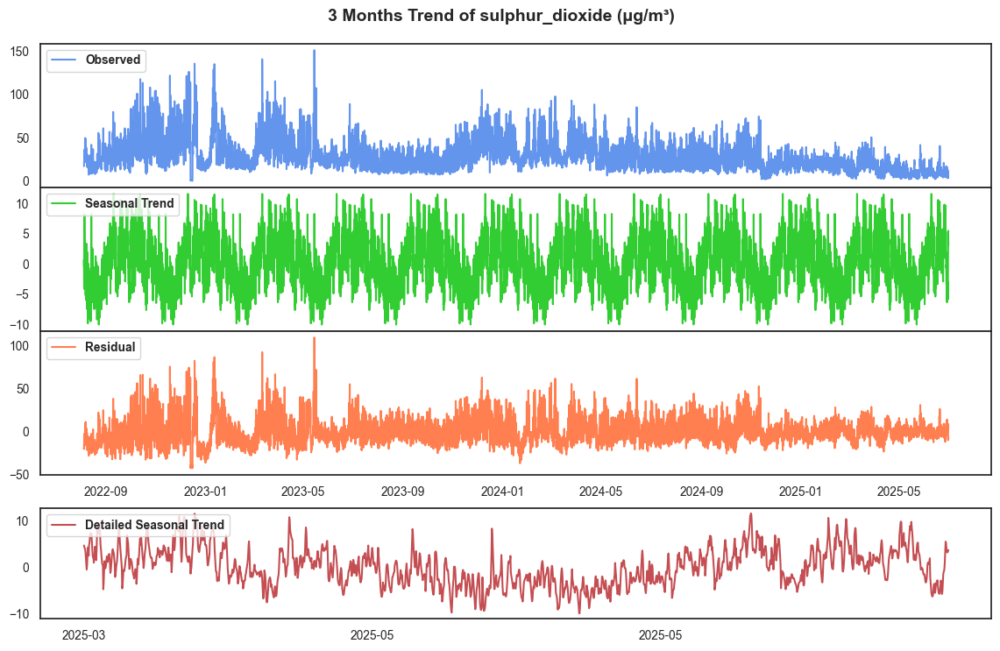

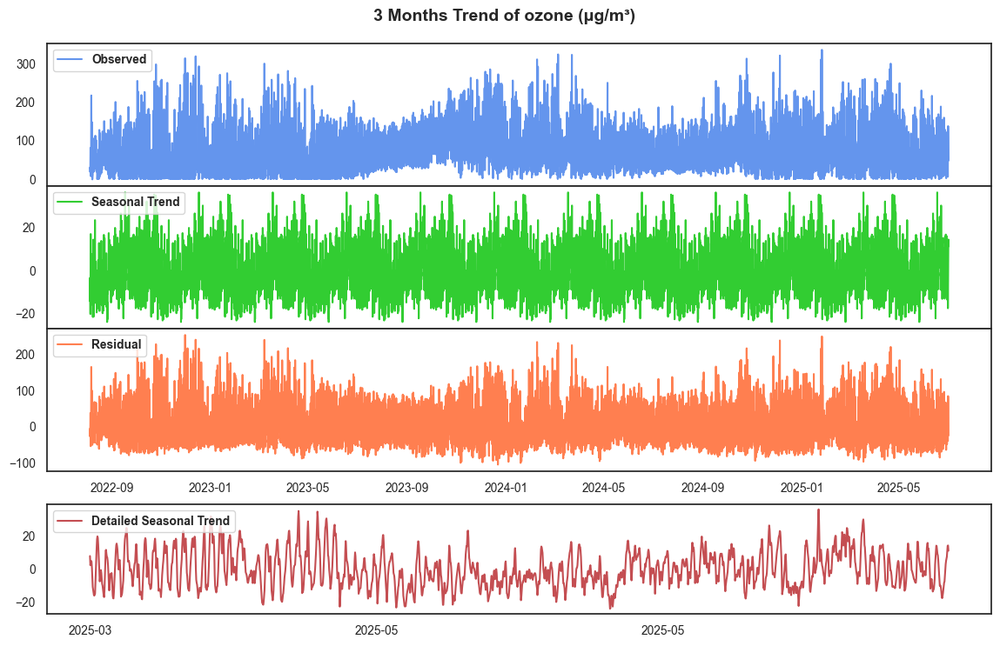

In [21]:
# 3 months seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.M3
)

##### Montly

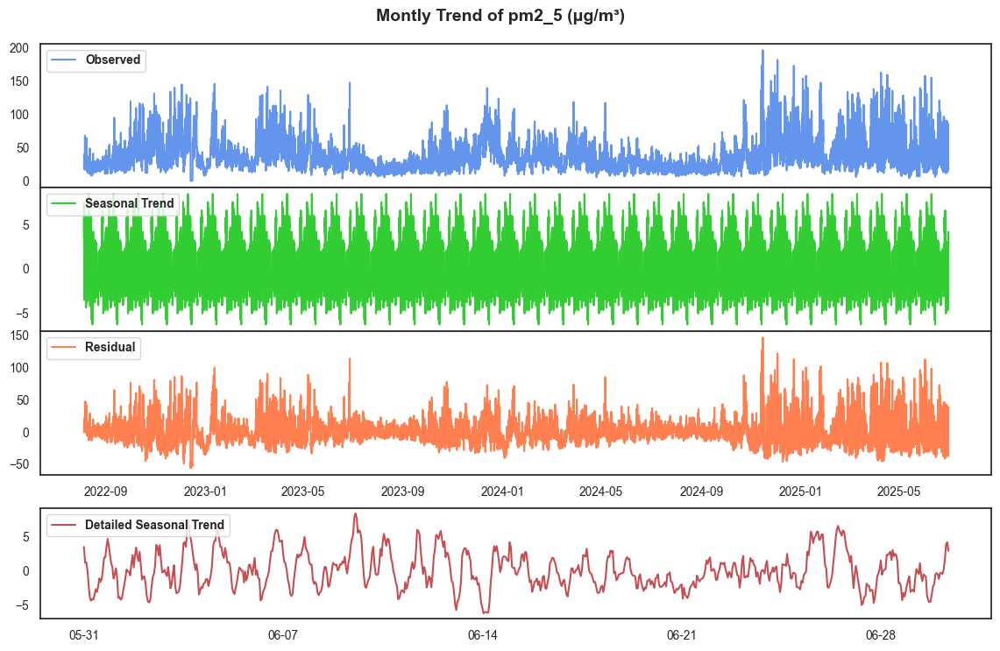

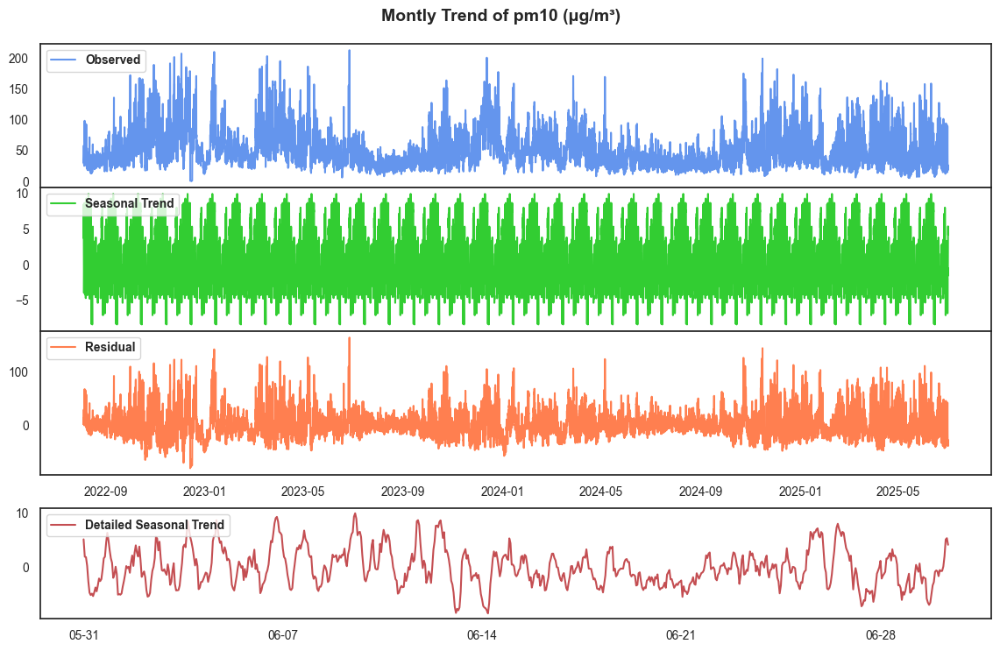

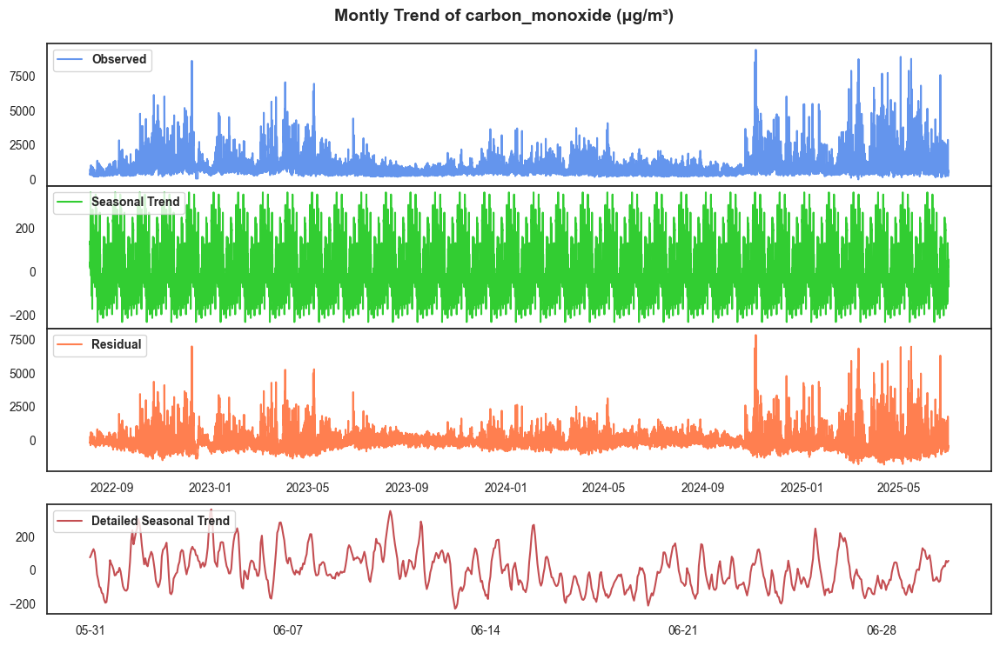

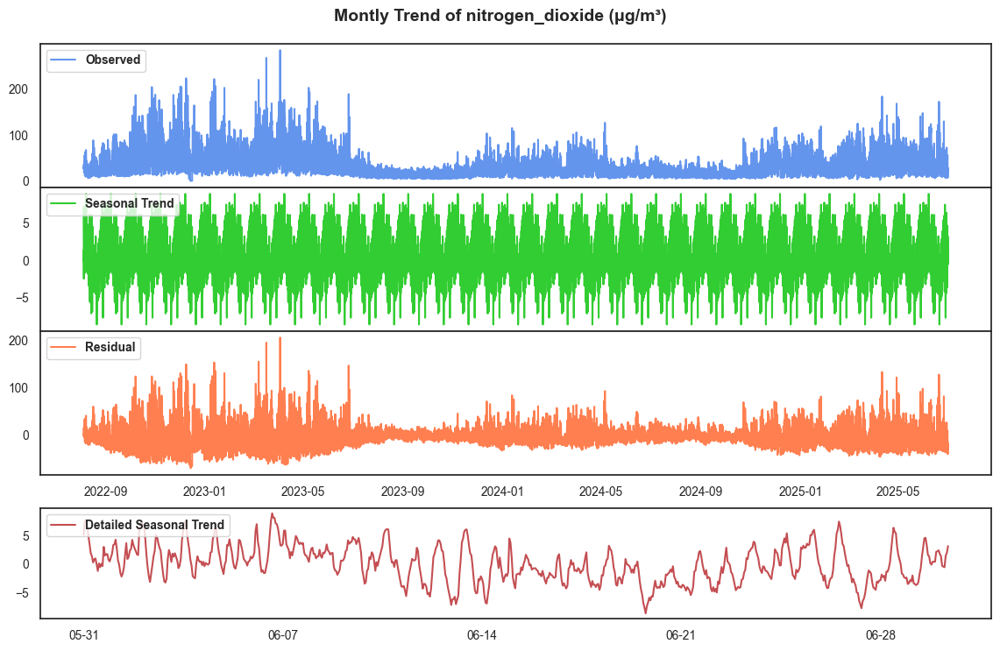

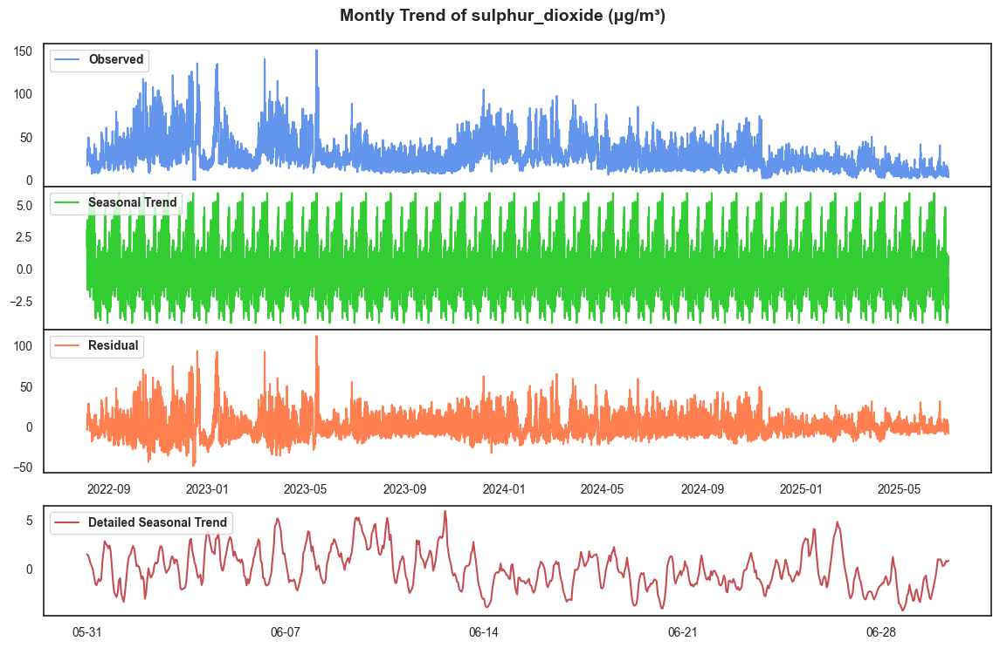

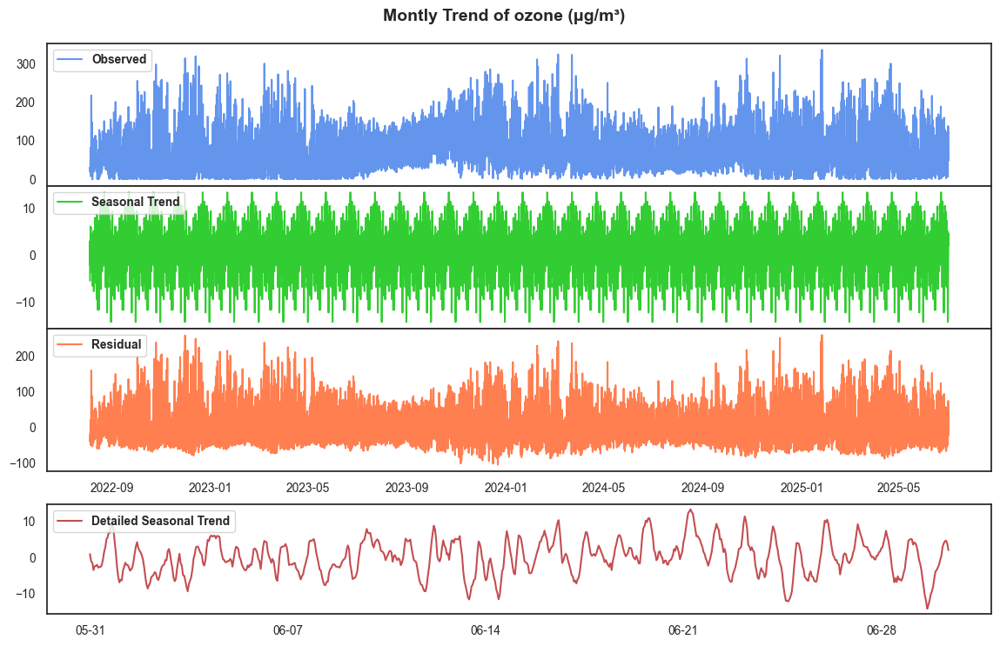

In [22]:
# 1 months seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.M1
)

##### Weekly

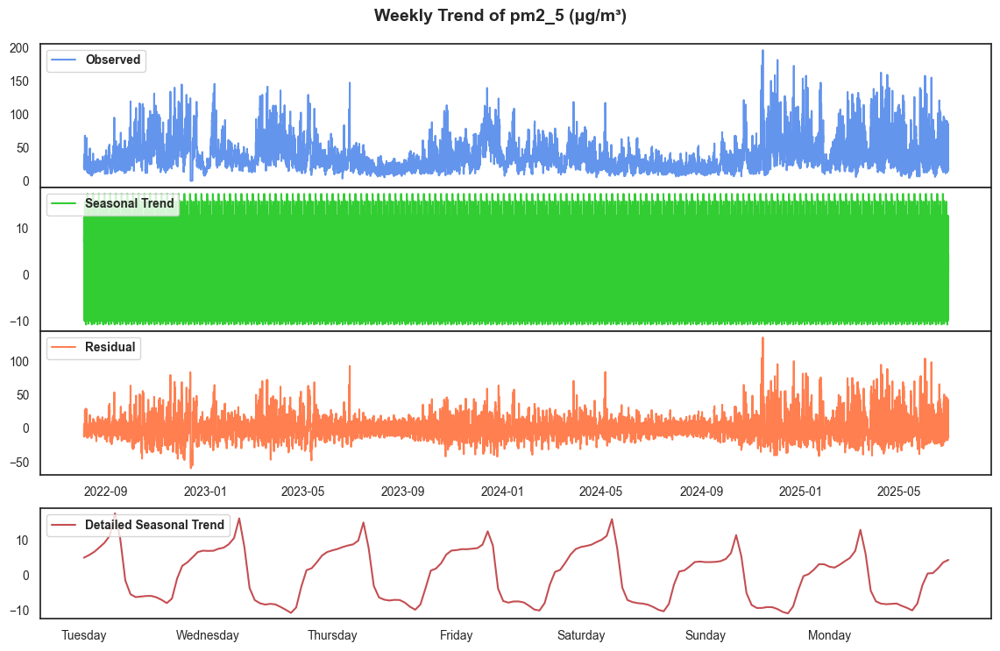

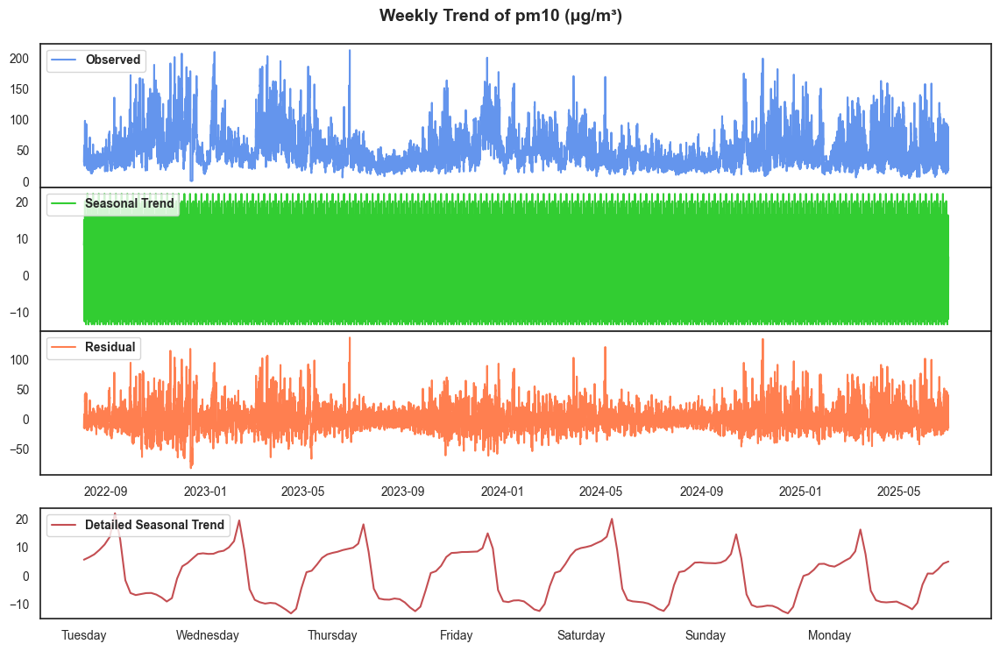

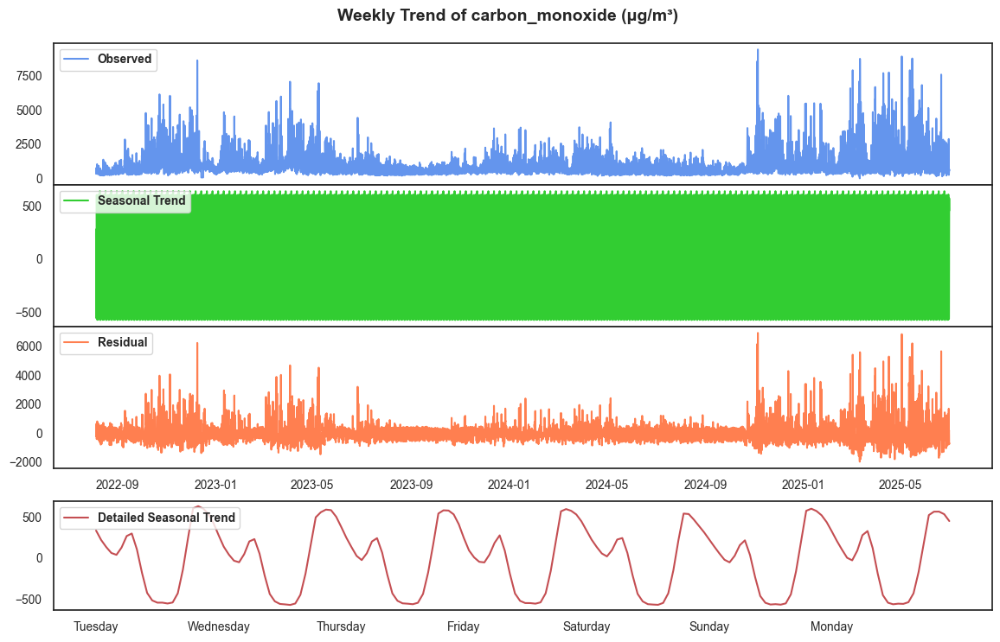

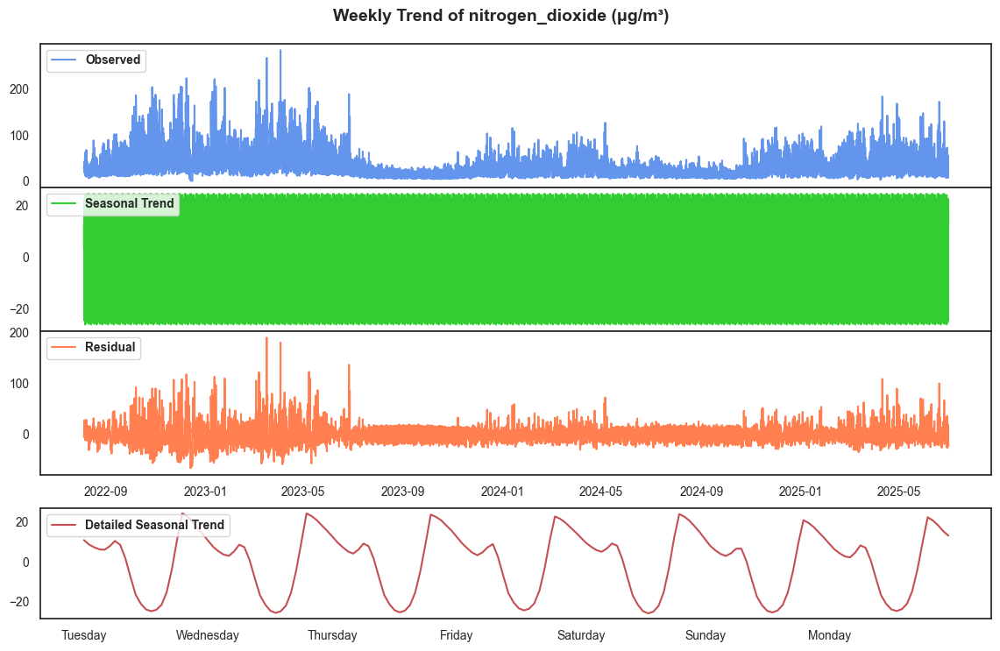

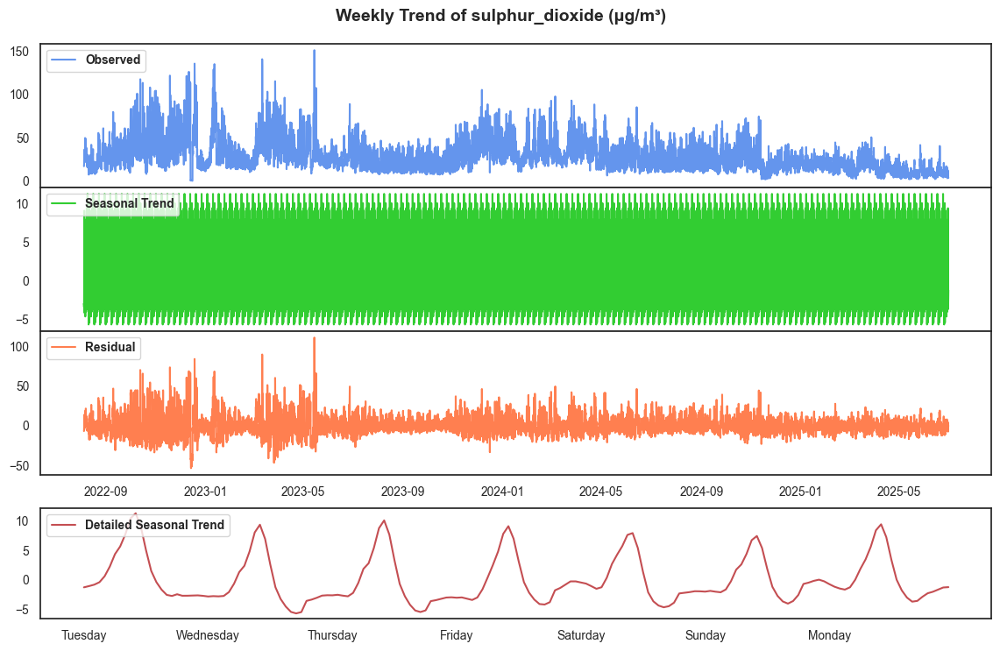

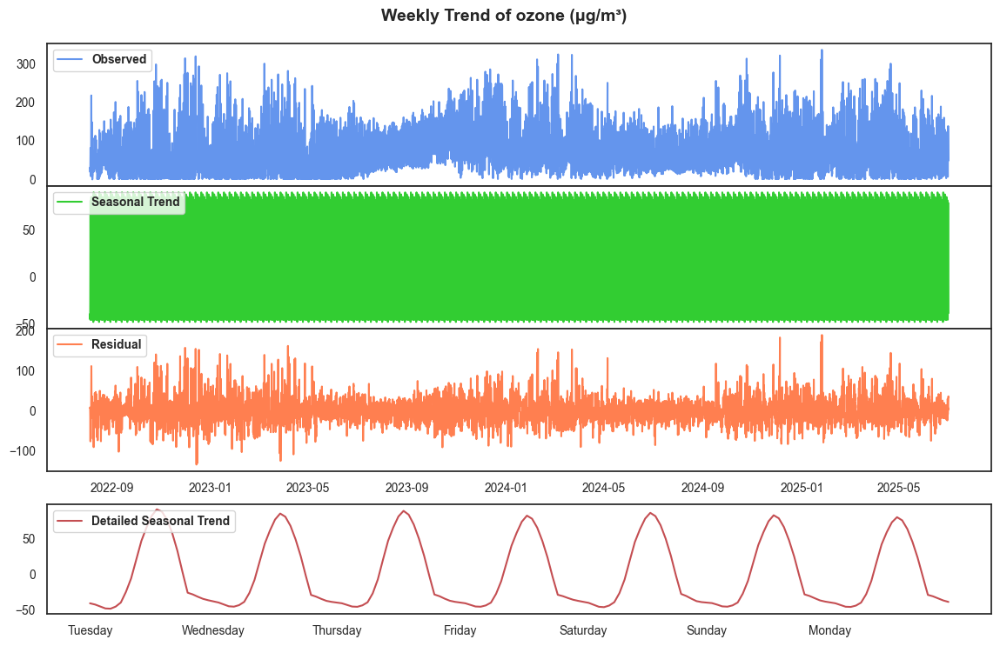

In [23]:
# weekly seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.W1
)

##### Daily

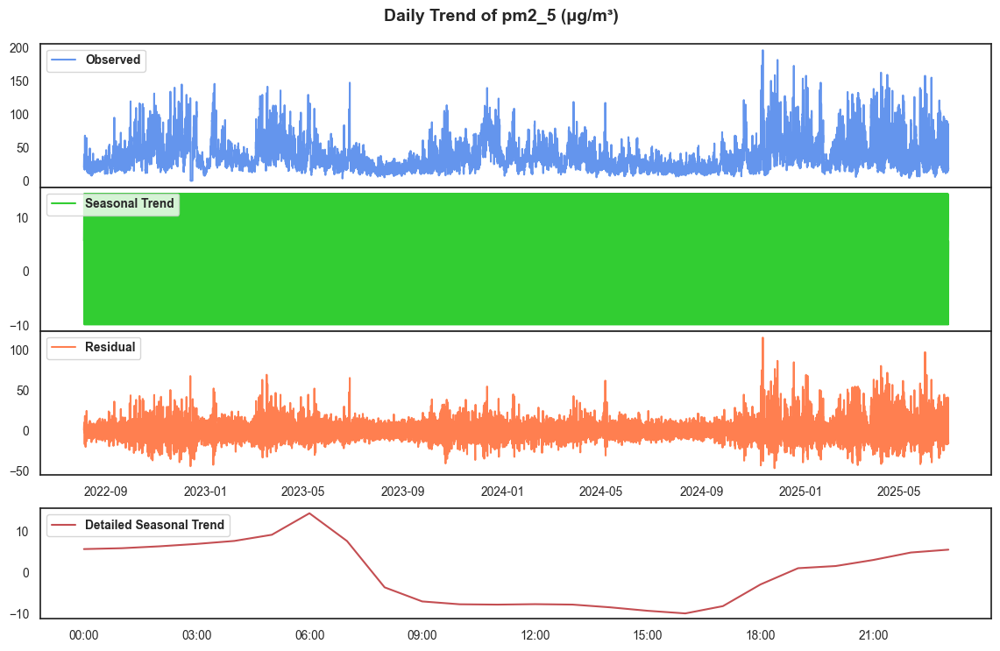

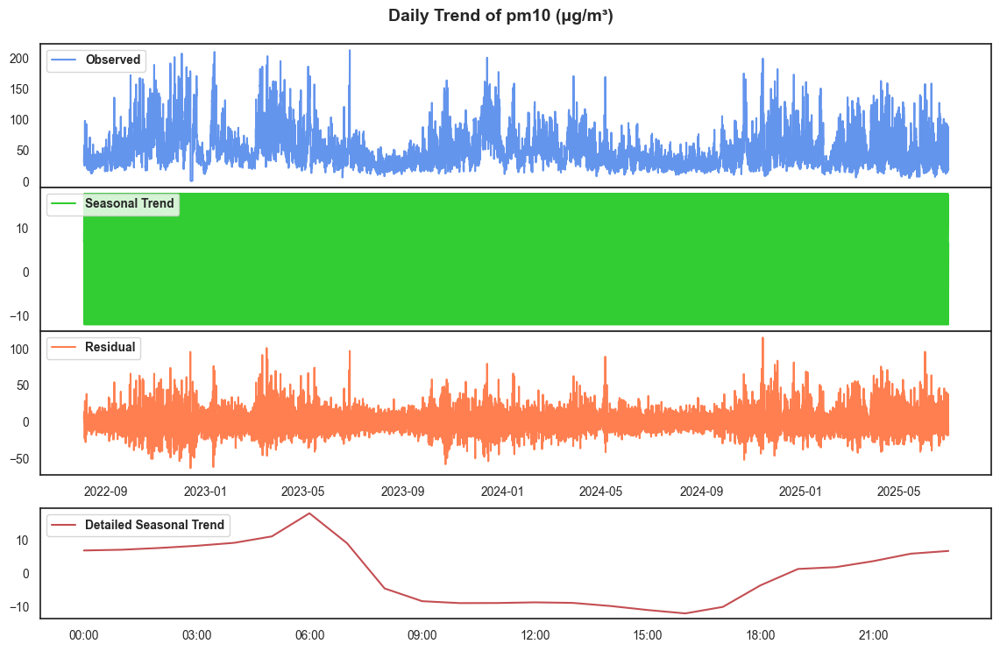

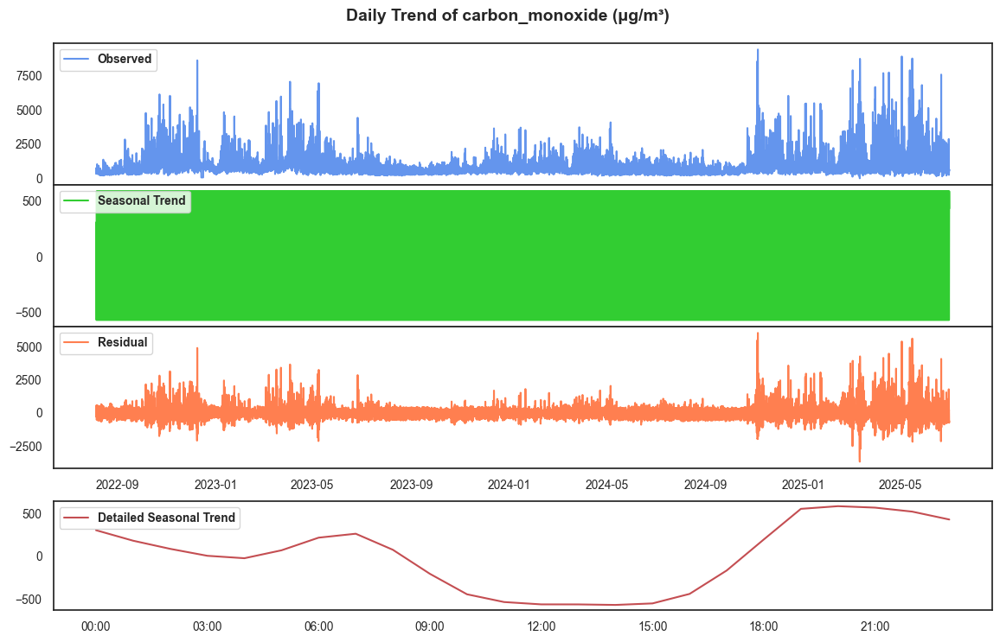

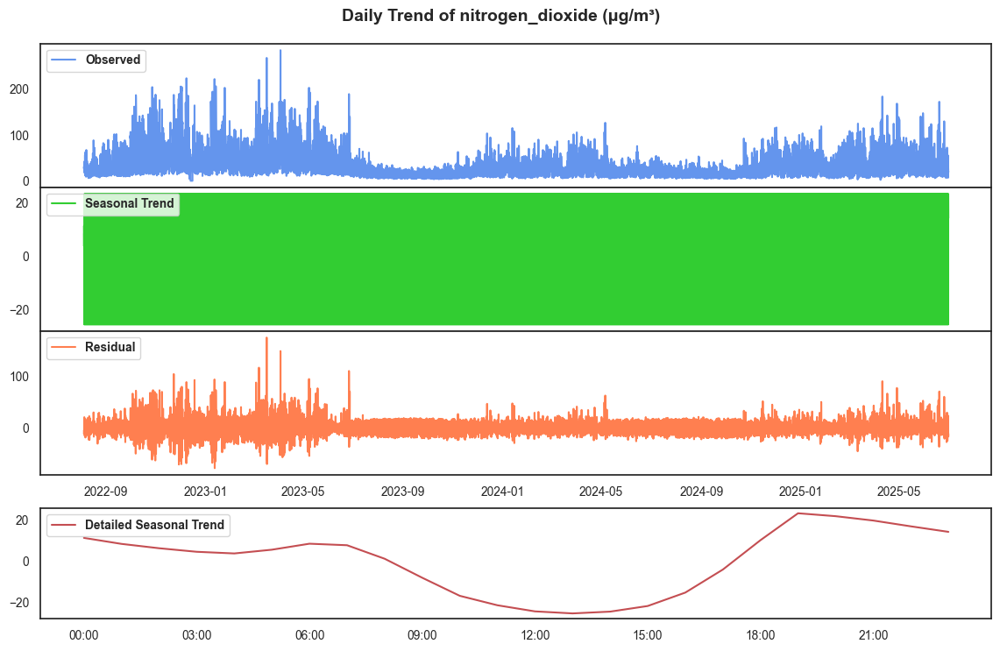

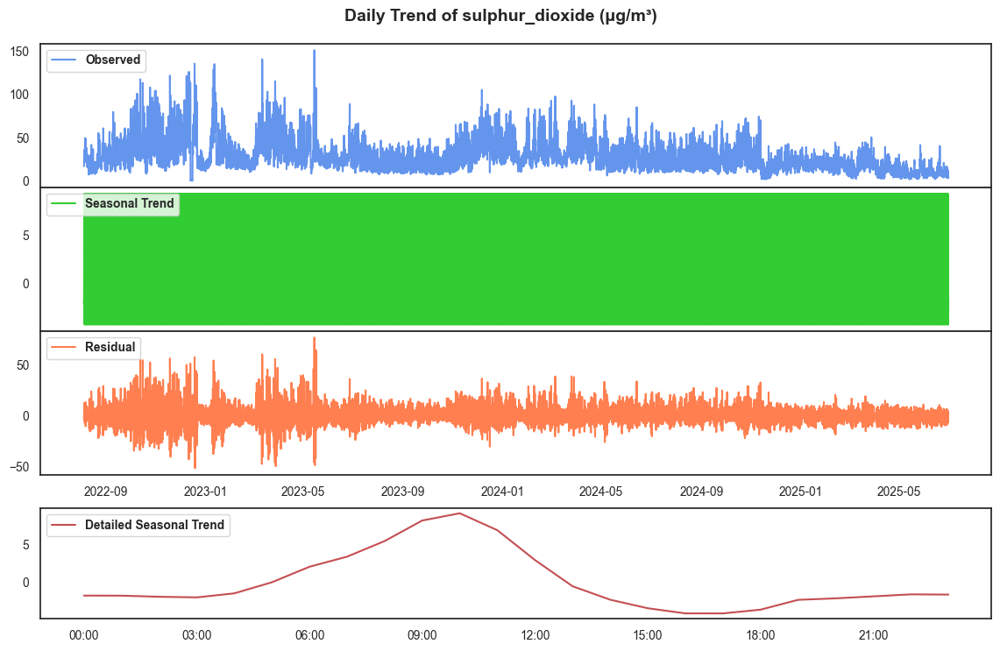

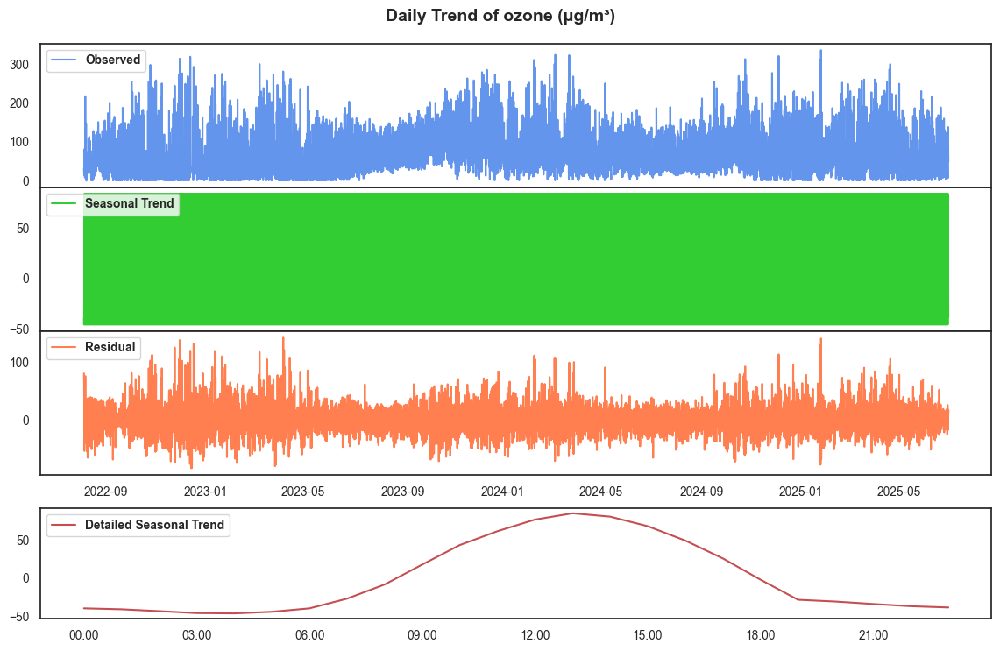

In [24]:
# daily seasonal-trend dependent data distribution
seasonal_decomp(
    df          = Y,
    col_decode  = col_decode,
    period_list = PeriodList.D1
)

### Outliers Handling

In [25]:
# Handling outliers with interpolation
# Copy dataframe first
df_past_encoded_nonoutliers = df_past_encoded.copy()

# Interpolate outliers for numerical columns
for i, col in enumerate(df_past_encoded_nonoutliers.columns[:ColumnGroup.NUMERICAL]):

    # Lewati kolom x4
    # Skip rain(X4) variable to be filtered
    if col == 'x4':
        continue
    
    # Extract statictical values
    stats = extract_statistical_values(df_past_encoded_nonoutliers[col], statdas.rename(columns=col_encode))
    
    # Identify outliers and replace with NaN
    outlier_filter = (
        (df_past_encoded_nonoutliers[col] < stats['lower_adjacent']) |
        (df_past_encoded_nonoutliers[col] > stats['upper_adjacent'])
    )

    # Handle 0 value in target variables
    if i < 6:
        outlier_filter |= (df_past_encoded_nonoutliers[col] <= 0)
        
    # Change to NaN first
    df_past_encoded_nonoutliers.loc[outlier_filter, col] = np.nan
    
    # Interpolate missing values linearly, then backfill and forward fill any remaining NaNs
    df_past_encoded_nonoutliers[col] = df_past_encoded_nonoutliers[col].interpolate(method='linear')
    df_past_encoded_nonoutliers[col] = df_past_encoded_nonoutliers[col].bfill().ffill()
    
# Check data
df_past_encoded_nonoutliers.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 25464 entries, 2022-08-05 00:00:00 to 2025-06-30 23:00:00
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   y1      25464 non-null  float64
 1   y2      25464 non-null  float64
 2   y3      25464 non-null  float64
 3   y4      25464 non-null  float64
 4   y5      25464 non-null  float64
 5   y6      25464 non-null  float64
 6   x1      25464 non-null  float64
 7   x2      25464 non-null  float64
 8   x3      25464 non-null  float64
 9   x4      25464 non-null  float64
 10  x5      25464 non-null  float64
 11  x6      25464 non-null  float64
 12  x7      25464 non-null  float64
 13  x8      25464 non-null  float64
dtypes: float64(14)
memory usage: 2.9 MB


In [26]:
# Double check descriptive statistics dataset after handling outliers
df_past_encoded_nonoutliers.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,35.665,19.440,0.500,20.400,30.600,46.700,86.100
y2,25464.000,48.135,25.121,0.800,28.600,41.600,62.900,114.300
y3,25464.000,895.876,528.729,59.000,481.000,738.000,1195.000,2278.000
y4,25464.000,36.335,24.851,2.000,16.800,28.500,51.500,102.700
y5,25464.000,27.293,14.888,0.200,15.900,23.800,36.100,66.400
y6,25464.000,68.207,55.298,1.000,24.000,53.000,105.000,228.000
x1,25464.000,27.835,2.829,21.100,25.600,27.200,29.700,35.800
x2,25464.000,76.627,15.831,35.000,68.000,80.000,90.000,100.000
x3,25464.000,23.056,1.579,19.200,22.200,23.500,24.200,26.700
x4,25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


### Bivariate Analysis

#### Data Distribution

In [27]:
# Initialize independent columns
independent_cols = df_past_encoded.columns[ColumnGroup.TARGET:]
independent_n = int(len(independent_cols) // 2)

# Check
print('All covariates:',independent_cols)
print('Number of all feature divided by 2:',independent_n)

All covariates: Index(['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8'], dtype='object')
Number of all feature divided by 2: 4


##### PM2.5

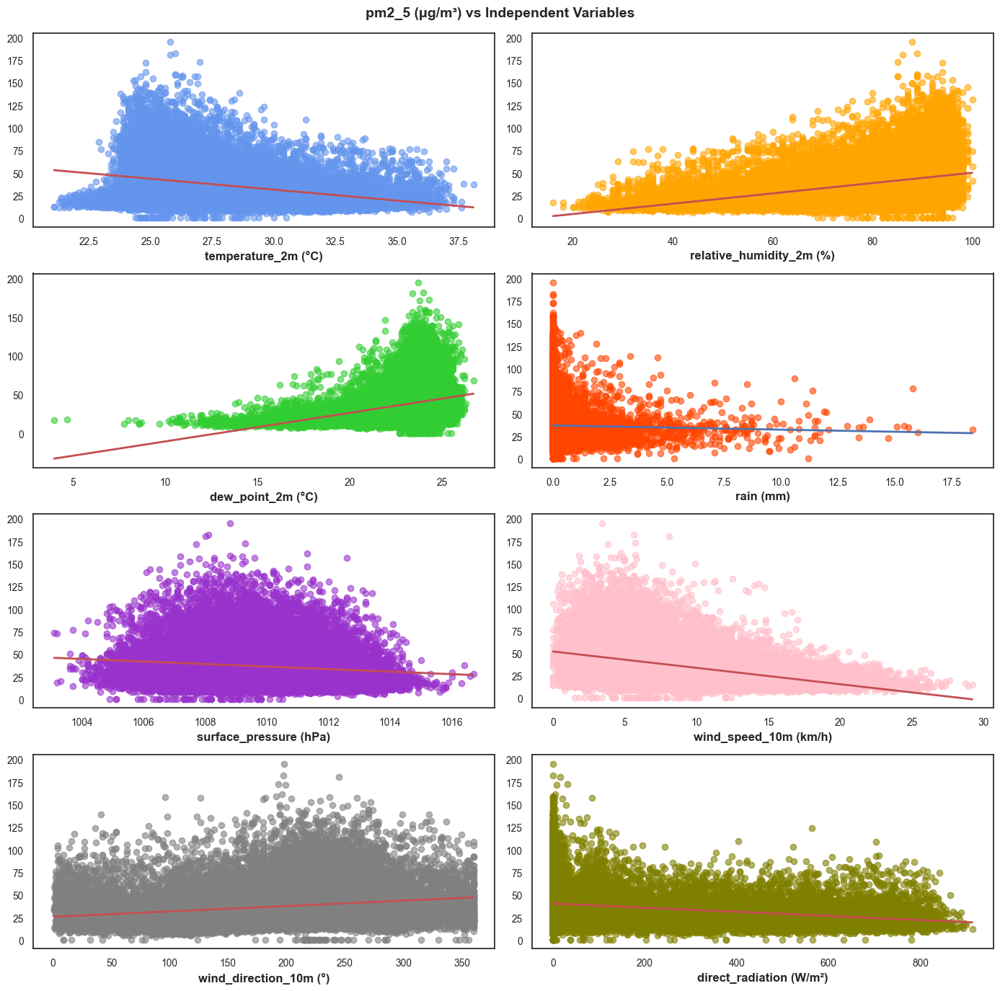

In [28]:
# PM2.5 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y1'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n)
)

##### PM10

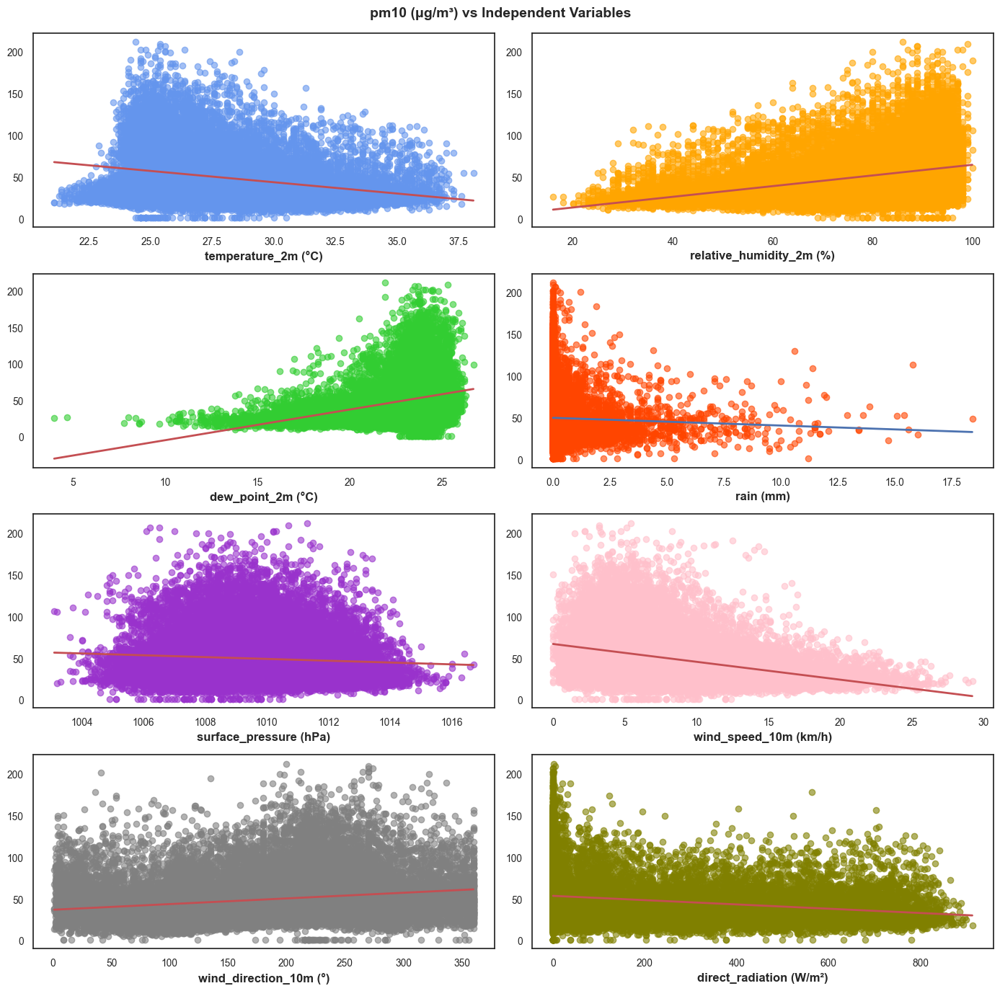

In [29]:
# PM10 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y2'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n)
)

##### CO

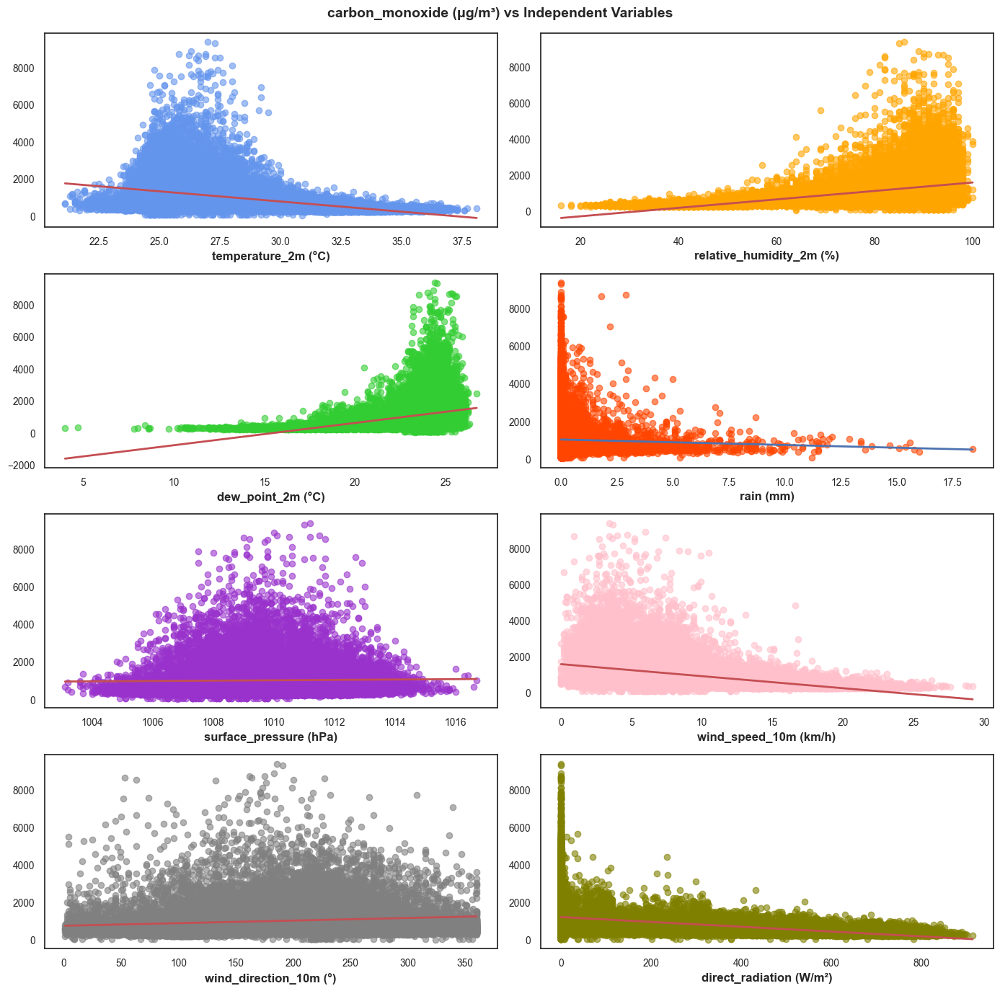

In [30]:
# CO vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y3'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n)
)

##### NO2

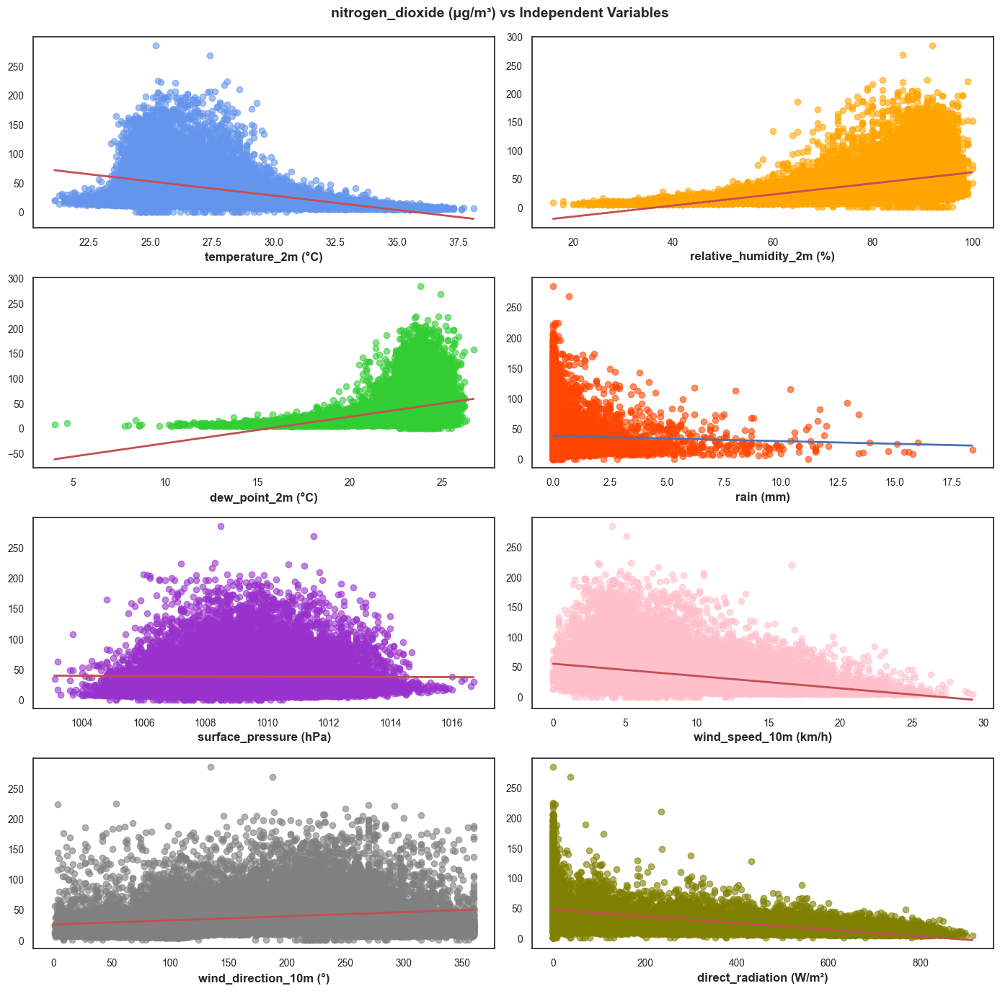

In [31]:
# NO2 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y4'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n)
)

##### SO2

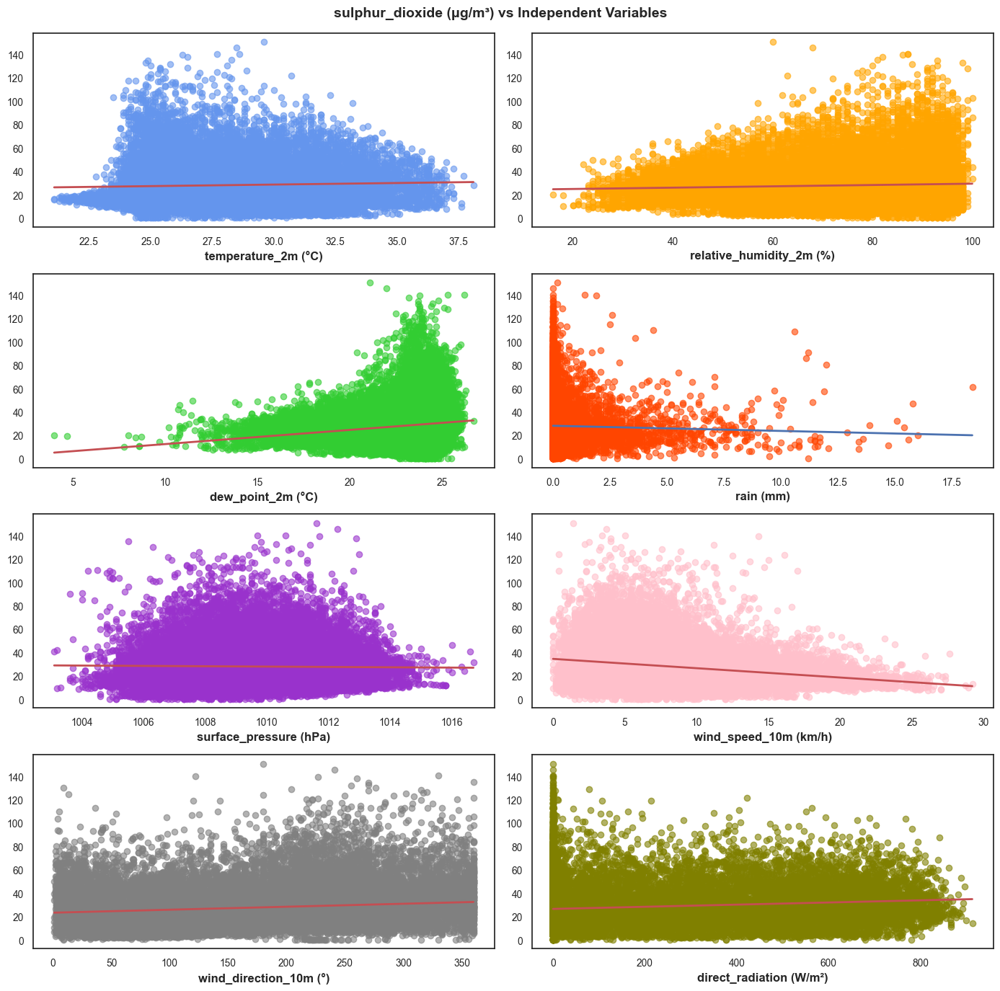

In [32]:
# SO2 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y5'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n)
)

##### O3

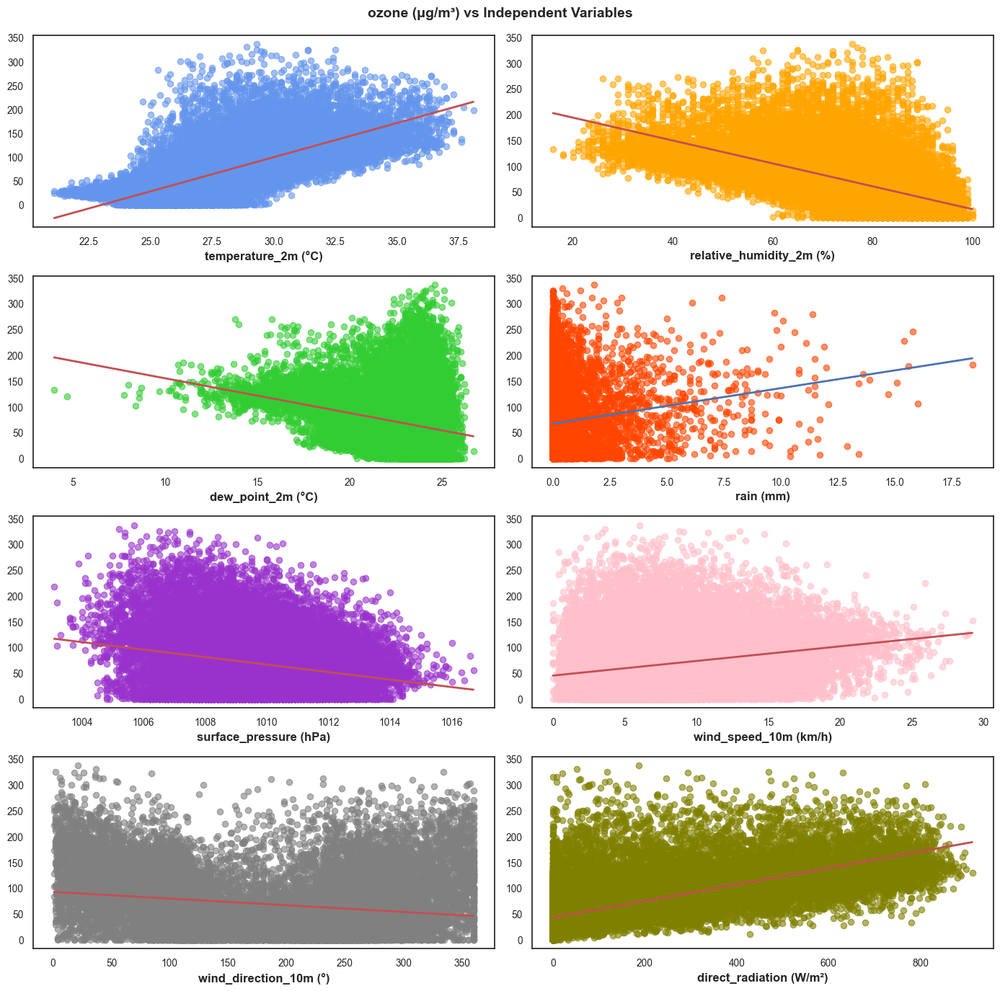

In [33]:
# O3 vs Independent Variables
bivariate_analysis(
    df            = df_past_encoded,
    Y             = df_past_encoded['y6'],
    X             = df_past_encoded[independent_cols],
    col_decode    = col_decode,
    nrows         = independent_n,
    ncols         = 2,
    color_variant = color_variant,
    figsize       = (14, 3.5 * independent_n)
)

#### Preparing Input for Correlation

In [34]:
# Split dataset target and features numerical and categorical (categorical max date same as past covariates)
X_num = df_past_encoded[df_past_encoded.columns[ColumnGroup.TARGET:ColumnGroup.NUMERICAL]]
X_cat = df_future_encoded.iloc[:len(df_past_encoded)][df_future_encoded.columns[-ColumnGroup.FEATURE_CATEGORICAL:]]
# Y already defined in Seasonal Decompose

# Check data shape
print('Y shape:', Y.shape)
print('X_num shape:', X_num.shape)
print('X_cat shape:', X_cat.shape,'\n')

print('Y Columns:', Y.columns.tolist())
print('X_num shape:', X_num.columns.tolist())
print('X_cat shape:', X_cat.columns.tolist())

Y shape: (25464, 6)
X_num shape: (25464, 8)
X_cat shape: (25464, 4) 

Y Columns: ['y1', 'y2', 'y3', 'y4', 'y5', 'y6']
X_num shape: ['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8']
X_cat shape: ['x9', 'x10', 'x11', 'x12']


In [35]:
# Create decode columns name
Y     = Y.rename(columns=col_decode).copy()
X_num = X_num.rename(columns=col_decode).copy()
X_cat = X_cat.rename(columns=col_decode).copy()

# Check
print('Y Columns:', Y.columns.tolist(), '\n')
print('X_num Columns:', X_num.columns.tolist(), '\n')
print('X_cat Columns:', X_cat.columns.tolist(), '\n')

Y Columns: ['pm2_5 (μg/m³)', 'pm10 (μg/m³)', 'carbon_monoxide (μg/m³)', 'nitrogen_dioxide (μg/m³)', 'sulphur_dioxide (μg/m³)', 'ozone (μg/m³)'] 

X_num Columns: ['temperature_2m (°C)', 'relative_humidity_2m (%)', 'dew_point_2m (°C)', 'rain (mm)', 'surface_pressure (hPa)', 'wind_speed_10m (km/h)', 'wind_direction_10m (°)', 'direct_radiation (W/m²)'] 

X_cat Columns: ['pembagian_waktu/hari', 'hari_per_minggu', 'hari_libur_nasional', 'musim'] 



#### Pearson Correlation

In [36]:
# Save results correlation
results_r = []

# Iterate though each pair of columns
for y_col in Y.columns:
    for x_col in X_num.columns:
        
        # Calculate Pearson correlation
        r, p_value = pearsonr(X_num[x_col], Y[y_col])
        
        # Store results_r
        results_r.append({
            'Target': y_col,
            'Feature': x_col,
            'Correlation': round(r, 3),
            'P-value': round(p_value, 3)
        })

# Convert result to dataframe
results_r = pd.DataFrame(results_r)

# Show results
print('results_r shape:', results_r.shape)
results_r.head()

results_r shape: (48, 4)


,Target,Feature,Correlation,P-value
0,pm2_5 (μg/m³),temperature_2m (°C),-0.299,0.000
1,pm2_5 (μg/m³),relative_humidity_2m (%),0.400,0.000
2,pm2_5 (μg/m³),dew_point_2m (°C),0.344,0.000
3,pm2_5 (μg/m³),rain (mm),-0.018,0.004
4,pm2_5 (μg/m³),surface_pressure (hPa),-0.116,0.000


In [37]:
# Checking correlation that most close to 0

# Convert negative correlation to absolute value to track closest to 0
results_r['AbsCorr'] = results_r['Correlation'].abs()

# Sort by absolute correlation value in ascending order
results_r = results_r.sort_values('AbsCorr', ascending=False)

# Check results
results_r.head()

,Target,Feature,Correlation,P-value,AbsCorr
40,ozone (μg/m³),temperature_2m (°C),0.708,0.000,0.708
47,ozone (μg/m³),direct_radiation (W/m²),0.667,0.000,0.667
41,ozone (μg/m³),relative_humidity_2m (%),-0.624,0.000,0.624
25,nitrogen_dioxide (μg/m³),relative_humidity_2m (%),0.518,0.000,0.518
24,nitrogen_dioxide (μg/m³),temperature_2m (°C),-0.457,0.000,0.457


In [38]:
# Filter significant correlations (p-value < 0.05)

# Check if any correlation is not significant
results_r_h0 = results_r[results_r['P-value'] >= 0.05]

# Check if any correltion is significant
results_r_h1 = results_r[results_r['P-value'] < 0.05]

In [39]:
# Check results that not significant
print('results_r_h0 shape:', results_r_h0.shape)
results_r_h0.head()

results_r_h0 shape: (1, 5)


,Target,Feature,Correlation,P-value,AbsCorr
28,nitrogen_dioxide (μg/m³),surface_pressure (hPa),-0.012,0.059,0.012


In [40]:
# Check results that is significant
print('results_r_h1 shape:', results_r_h1.shape)
results_r_h1.head()

results_r_h1 shape: (47, 5)


,Target,Feature,Correlation,P-value,AbsCorr
40,ozone (μg/m³),temperature_2m (°C),0.708,0.000,0.708
47,ozone (μg/m³),direct_radiation (W/m²),0.667,0.000,0.667
41,ozone (μg/m³),relative_humidity_2m (%),-0.624,0.000,0.624
25,nitrogen_dioxide (μg/m³),relative_humidity_2m (%),0.518,0.000,0.518
24,nitrogen_dioxide (μg/m³),temperature_2m (°C),-0.457,0.000,0.457


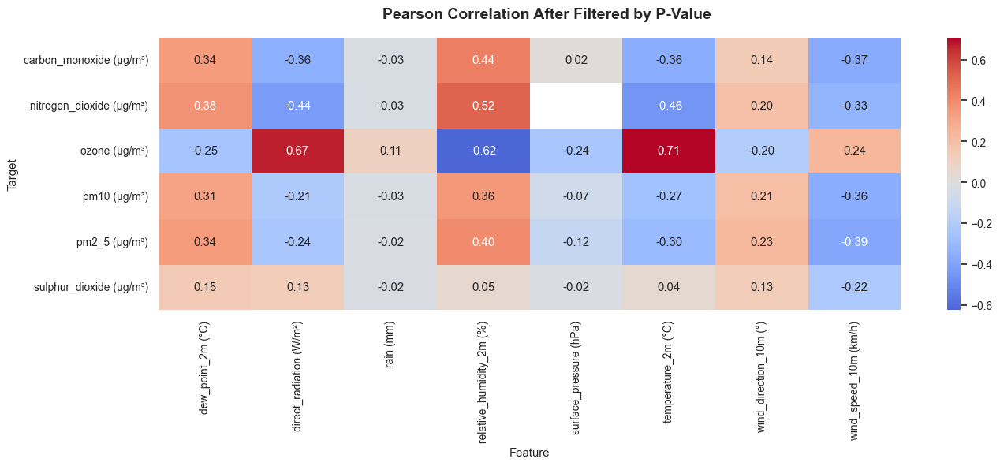

In [41]:
# Data distribution with Pearson Correlation
correlation_heatmap(
    df        = results_r_h1,
    method    = 'pearson',
    title     = 'Pearson Correlation After Filtered by P-Value',
    save_path = '../reports/figures/bivariate_analysis/heatmap_pearson_filtered.png'
)

In [42]:
# Calculate mean absolute correlation for each feature
results_r = results_r_h1['Correlation'].abs().groupby(results_r_h1['Feature']).mean().sort_values(ascending=False)
results_r

Feature
relative_humidity_2m (%)   0.399
temperature_2m (°C)        0.356
direct_radiation (W/m²)    0.339
wind_speed_10m (km/h)      0.319
dew_point_2m (°C)          0.296
wind_direction_10m (°)     0.182
surface_pressure (hPa)     0.093
rain (mm)                  0.039
Name: Correlation, dtype: float64

#### Spearman Correlation

In [43]:
# Save results correlation
results_rs = []

# Iterate though each pair of columns
for y_col in Y.columns:
    for x_col in X_cat.columns:
        
        # Calculate Pearson correlation
        r, p_value = spearmanr(X_cat[x_col], Y[y_col])
        
        # Store results_rs
        results_rs.append({
            'Target': y_col,
            'Feature': x_col,
            'Correlation': round(r, 3),
            'P-value': round(p_value, 3)
        })

# Convert result to dataframe
results_rs = pd.DataFrame(results_rs)

# Show results
print('results_rs shape:', results_rs.shape)
results_rs.head()

results_rs shape: (24, 4)


,Target,Feature,Correlation,P-value
0,pm2_5 (μg/m³),pembagian_waktu/hari,0.075,0.000
1,pm2_5 (μg/m³),hari_per_minggu,-0.017,0.008
2,pm2_5 (μg/m³),hari_libur_nasional,0.002,0.718
3,pm2_5 (μg/m³),musim,0.307,0.000
4,pm10 (μg/m³),pembagian_waktu/hari,0.075,0.000


In [44]:
# Checking correlation that most close to 0

# Copy dataframe first
results_rs = results_rs.copy()

# Convert negative correlation to absolute value to track closest to 0
results_rs['AbsCorr'] = results_rs['Correlation'].abs()

# Sort by absolute correlation value in ascending order
results_rs = results_rs.sort_values('AbsCorr', ascending=False)

# Check results
results_rs.head()

,Target,Feature,Correlation,P-value,AbsCorr
20,ozone (μg/m³),pembagian_waktu/hari,-0.383,0.000,0.383
3,pm2_5 (μg/m³),musim,0.307,0.000,0.307
7,pm10 (μg/m³),musim,0.298,0.000,0.298
12,nitrogen_dioxide (μg/m³),pembagian_waktu/hari,0.250,0.000,0.250
19,sulphur_dioxide (μg/m³),musim,0.216,0.000,0.216


In [45]:
# Filter significant correlations (p-value < 0.05)

# Check if any correlation is not significant
results_rs_h0 = results_rs[results_rs['P-value'] >= 0.05]

# Check if any correltion is significant
results_rs_h1 = results_rs[results_rs['P-value'] < 0.05]

In [46]:
# Check results that not significant
print('results_rs_h0 shape:', results_rs_h0.shape)
results_rs_h0

results_rs_h0 shape: (6, 5)


,Target,Feature,Correlation,P-value,AbsCorr
10,carbon_monoxide (μg/m³),hari_libur_nasional,0.011,0.067,0.011
13,nitrogen_dioxide (μg/m³),hari_per_minggu,-0.007,0.268,0.007
6,pm10 (μg/m³),hari_libur_nasional,-0.006,0.343,0.006
2,pm2_5 (μg/m³),hari_libur_nasional,0.002,0.718,0.002
21,ozone (μg/m³),hari_per_minggu,-0.002,0.715,0.002
18,sulphur_dioxide (μg/m³),hari_libur_nasional,-0.001,0.883,0.001


In [47]:
# Check results that is significant
print('results_rs_h1 shape:', results_rs_h1.shape)
results_rs_h1.head()

results_rs_h1 shape: (18, 5)


,Target,Feature,Correlation,P-value,AbsCorr
20,ozone (μg/m³),pembagian_waktu/hari,-0.383,0.000,0.383
3,pm2_5 (μg/m³),musim,0.307,0.000,0.307
7,pm10 (μg/m³),musim,0.298,0.000,0.298
12,nitrogen_dioxide (μg/m³),pembagian_waktu/hari,0.250,0.000,0.250
19,sulphur_dioxide (μg/m³),musim,0.216,0.000,0.216


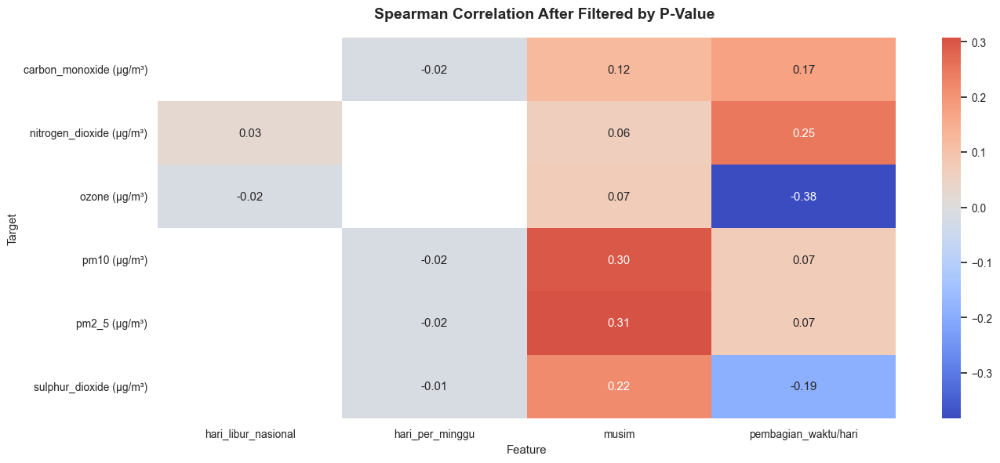

In [48]:
# Data distribution with Pearson Correlation
correlation_heatmap(
    df        = results_rs_h1,
    method    = 'spearman',
    title     = 'Spearman Correlation After Filtered by P-Value',
    save_path = '../reports/figures/bivariate_analysis/heatmap_spearman_filtered.png'
)

In [49]:
results_rs = results_rs_h1['Correlation'].abs().groupby(results_rs_h1['Feature']).mean().sort_values(ascending=False)
results_rs

Feature
pembagian_waktu/hari   0.191
musim                  0.180
hari_libur_nasional    0.021
hari_per_minggu        0.017
Name: Correlation, dtype: float64

#### Feature Selection

In [50]:
# Check overall correlation score for numerical columns
results_r

Feature
relative_humidity_2m (%)   0.399
temperature_2m (°C)        0.356
direct_radiation (W/m²)    0.339
wind_speed_10m (km/h)      0.319
dew_point_2m (°C)          0.296
wind_direction_10m (°)     0.182
surface_pressure (hPa)     0.093
rain (mm)                  0.039
Name: Correlation, dtype: float64

In [51]:
# Take very low correlation level (0.00 - 0.199) to drop
results_r = results_r.reset_index()
X_num_drop = results_r[results_r['Correlation'] <= 0.199]['Feature'].to_list()
X_num_drop

['wind_direction_10m (°)', 'surface_pressure (hPa)', 'rain (mm)']

In [52]:
# Drop columns
X_num = X_num.drop(columns=X_num_drop)
X_num.head()

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),wind_speed_10m (km/h),direct_radiation (W/m²)
t,,,,,
2022-08-05 00:00:00,25.600,82.000,22.300,6.400,0.000
2022-08-05 01:00:00,25.100,79.000,21.300,9.000,0.000
2022-08-05 02:00:00,24.300,81.000,20.800,7.600,0.000
2022-08-05 03:00:00,23.900,82.000,20.600,6.300,0.000
2022-08-05 04:00:00,23.400,85.000,20.700,4.100,0.000


# Export Data Preprocessed

Export data preprocessed (past and future covariates are exported differently)

## Past Covariates With Outliers

In [53]:
# Check describtive statistics
df_past_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,37.089,23.131,0.500,20.400,30.600,46.800,195.600
y2,25464.000,49.540,28.895,0.800,28.600,41.600,62.900,212.300
y3,25464.000,1010.616,870.051,0.000,481.000,738.000,1200.000,9391.000
y4,25464.000,38.159,30.539,0.000,16.700,28.300,51.100,284.800
y5,25464.000,28.182,17.439,0.200,15.900,23.800,36.100,150.900
y6,25464.000,68.488,57.695,-1.000,23.000,53.000,105.000,337.000
x1,25464.000,27.843,2.852,21.100,25.600,27.200,29.700,38.100
x2,25464.000,76.477,16.225,16.000,68.000,80.000,90.000,100.000
x3,25464.000,22.846,2.150,4.000,22.200,23.500,24.200,26.700
x4,25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


In [54]:
# Change 0 or minus value into NaN
# Iterate through each Y columns 
for col in df_past_encoded.columns[:ColumnGroup.TARGET]:

    # Changes that value <= 0 to NaN
    df_past_encoded[col] = df_past_encoded[col].mask(df_past_encoded[col] <= 0, np.nan)

    # Replace NaN with interpolate
    df_past_encoded[col] = df_past_encoded[col].interpolate(method='time')
    df_past_encoded[col] = df_past_encoded[col].bfill().ffill()

# Check results
df_past_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,37.089,23.131,0.500,20.400,30.600,46.800,195.600
y2,25464.000,49.540,28.895,0.800,28.600,41.600,62.900,212.300
y3,25464.000,1010.629,870.038,59.000,481.000,738.000,1200.000,9391.000
y4,25464.000,38.288,30.493,2.000,16.800,28.500,51.500,284.800
y5,25464.000,28.182,17.439,0.200,15.900,23.800,36.100,150.900
y6,25464.000,68.883,57.311,1.000,24.000,53.000,105.000,337.000
x1,25464.000,27.843,2.852,21.100,25.600,27.200,29.700,38.100
x2,25464.000,76.477,16.225,16.000,68.000,80.000,90.000,100.000
x3,25464.000,22.846,2.150,4.000,22.200,23.500,24.200,26.700
x4,25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


In [55]:
# Chek data
df_past_encoded

,y1,y2,y3,y4,y5,y6,x1,x2,x3,x4,x5,x6,x7,x8
t,,,,,,,,,,,,,,
2022-08-05 00:00:00,20.500,31.000,383.000,30.100,17.000,30.000,25.600,82.000,22.300,0.000,1010.500,6.400,286.000,0.000
2022-08-05 01:00:00,22.400,33.400,333.000,26.900,17.000,30.000,25.100,79.000,21.300,0.000,1010.200,9.000,275.000,0.000
2022-08-05 02:00:00,24.900,36.900,327.000,26.600,17.100,27.000,24.300,81.000,20.800,0.000,1010.200,7.600,262.000,0.000
2022-08-05 03:00:00,26.800,39.600,340.000,27.600,17.500,23.000,23.900,82.000,20.600,0.000,1010.300,6.300,239.000,0.000
2022-08-05 04:00:00,27.300,40.000,384.000,29.000,19.000,19.000,23.400,85.000,20.700,0.000,1010.700,4.100,218.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-30 19:00:00,24.100,26.100,568.000,28.000,4.300,55.000,27.800,70.000,21.900,0.000,1009.200,14.200,98.000,0.000
2025-06-30 20:00:00,20.700,22.400,609.000,25.000,4.100,55.000,27.800,74.000,22.700,0.000,1009.400,12.200,99.000,0.000
2025-06-30 21:00:00,18.800,20.400,650.000,21.000,3.800,55.000,27.400,76.000,22.900,0.000,1010.100,9.700,91.000,0.000


In [56]:
# Save as CSV
df_past_encoded.to_csv('../data/processed/past_covariates.csv', index=True)

## Past Covariates Without Outliers

In [57]:
# Handling outliers with interpolation
# Copy dataframe first
df_past_encoded_nonoutliers = df_past_encoded.copy()

# Interpolate outliers for numerical columns
for i, col in enumerate(df_past_encoded_nonoutliers):

    # Skip rain(X4) variable to be filtered
    if col == 'x4':
        continue
    
    # Extract statictical values
    stats = extract_statistical_values(df_past_encoded_nonoutliers[col], statdas.rename(columns=col_encode))
    
    # Identify outliers and replace with NaN
    outlier_filter = (
        (df_past_encoded_nonoutliers[col] < stats['lower_adjacent']) |
        (df_past_encoded_nonoutliers[col] > stats['upper_adjacent'])
    )

    # Handle 0 value in target variables
    if i < 6:
        outlier_filter |= (df_past_encoded_nonoutliers[col] <= 0)
        
    # Change to NaN first
    df_past_encoded_nonoutliers.loc[outlier_filter, col] = np.nan
    
    # Interpolate missing values linearly, then backfill and forward fill any remaining NaNs
    df_past_encoded_nonoutliers[col] = df_past_encoded_nonoutliers[col].interpolate(method='linear')
    df_past_encoded_nonoutliers[col] = df_past_encoded_nonoutliers[col].bfill().ffill()
    
# Check data
df_past_encoded_nonoutliers.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 25464 entries, 2022-08-05 00:00:00 to 2025-06-30 23:00:00
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   y1      25464 non-null  float64
 1   y2      25464 non-null  float64
 2   y3      25464 non-null  float64
 3   y4      25464 non-null  float64
 4   y5      25464 non-null  float64
 5   y6      25464 non-null  float64
 6   x1      25464 non-null  float64
 7   x2      25464 non-null  float64
 8   x3      25464 non-null  float64
 9   x4      25464 non-null  float64
 10  x5      25464 non-null  float64
 11  x6      25464 non-null  float64
 12  x7      25464 non-null  float64
 13  x8      25464 non-null  float64
dtypes: float64(14)
memory usage: 2.9 MB


In [58]:
# Check data
df_past_encoded_nonoutliers

,y1,y2,y3,y4,y5,y6,x1,x2,x3,x4,x5,x6,x7,x8
t,,,,,,,,,,,,,,
2022-08-05 00:00:00,20.500,31.000,383.000,30.100,17.000,30.000,25.600,82.000,22.300,0.000,1010.500,6.400,286.000,0.000
2022-08-05 01:00:00,22.400,33.400,333.000,26.900,17.000,30.000,25.100,79.000,21.300,0.000,1010.200,9.000,275.000,0.000
2022-08-05 02:00:00,24.900,36.900,327.000,26.600,17.100,27.000,24.300,81.000,20.800,0.000,1010.200,7.600,262.000,0.000
2022-08-05 03:00:00,26.800,39.600,340.000,27.600,17.500,23.000,23.900,82.000,20.600,0.000,1010.300,6.300,239.000,0.000
2022-08-05 04:00:00,27.300,40.000,384.000,29.000,19.000,19.000,23.400,85.000,20.700,0.000,1010.700,4.100,218.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-30 19:00:00,24.100,26.100,568.000,28.000,4.300,55.000,27.800,70.000,21.900,0.000,1009.200,14.200,98.000,0.000
2025-06-30 20:00:00,20.700,22.400,609.000,25.000,4.100,55.000,27.800,74.000,22.700,0.000,1009.400,12.200,99.000,0.000
2025-06-30 21:00:00,18.800,20.400,650.000,21.000,3.800,55.000,27.400,76.000,22.900,0.000,1010.100,9.700,91.000,0.000


In [59]:
# Double check descriptive statistics dataset after handling outliers
df_past_encoded_nonoutliers.describe().T

,count,mean,std,min,25%,50%,75%,max
y1,25464.000,35.665,19.440,0.500,20.400,30.600,46.700,86.100
y2,25464.000,48.135,25.121,0.800,28.600,41.600,62.900,114.300
y3,25464.000,895.876,528.729,59.000,481.000,738.000,1195.000,2278.000
y4,25464.000,36.335,24.851,2.000,16.800,28.500,51.500,102.700
y5,25464.000,27.293,14.888,0.200,15.900,23.800,36.100,66.400
y6,25464.000,68.207,55.298,1.000,24.000,53.000,105.000,228.000
x1,25464.000,27.835,2.829,21.100,25.600,27.200,29.700,35.800
x2,25464.000,76.627,15.831,35.000,68.000,80.000,90.000,100.000
x3,25464.000,23.056,1.579,19.200,22.200,23.500,24.200,26.700
x4,25464.000,0.222,0.912,0.000,0.000,0.000,0.000,18.400


In [60]:
# Save as CSV
df_past_encoded_nonoutliers.to_csv('../data/processed/past_covariates_nonoutliers.csv', index=True)

## Future Covariates

In [61]:
# Check statistics descriptive
df_future_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
x9,35707.000,2.208,0.815,1.000,1.000,2.000,3.000,3.000
x10,35707.000,4.002,2.001,1.000,2.000,4.000,6.000,7.000
x11,35707.000,0.045,0.207,0.000,0.000,0.000,0.000,1.000
x12,35707.000,1.571,0.495,1.000,1.000,2.000,2.000,2.000


In [62]:
# Check data
df_future_encoded

,x9,x10,x11,x12
t,,,,
2022-08-05 00:00:00,3.000,5.000,0.000,1.000
2022-08-05 01:00:00,3.000,5.000,0.000,1.000
2022-08-05 02:00:00,3.000,5.000,0.000,1.000
2022-08-05 03:00:00,3.000,5.000,0.000,1.000
2022-08-05 04:00:00,3.000,5.000,0.000,1.000
...,...,...,...,...
2026-08-31 19:00:00,3.000,1.000,0.000,1.000
2026-08-31 20:00:00,3.000,1.000,0.000,1.000
2026-08-31 21:00:00,3.000,1.000,0.000,1.000


In [63]:
# Save as CSV
df_future_encoded.to_csv('../data/processed/future_covariates.csv', index=True)

## Correlation Results

In [64]:
# Check correlation results
print('type:',type(results_r))
results_r

type: <class 'pandas.core.frame.DataFrame'>


,Feature,Correlation
0,relative_humidity_2m (%),0.399
1,temperature_2m (°C),0.356
2,direct_radiation (W/m²),0.339
3,wind_speed_10m (km/h),0.319
4,dew_point_2m (°C),0.296
5,wind_direction_10m (°),0.182
6,surface_pressure (hPa),0.093
7,rain (mm),0.039


In [65]:
# Save correlation results
results_r.to_csv('../data/processed/correlation_scores.csv', index=False, header=True)